In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# https://arxiv.org/pdf/2006.11239.pdf

import torch
from torch import optim, nn

import json
from tqdm import tqdm
from random import randint

from load_dataset import load_dataset, plot_image, load_contour
from UNet import UNet, UNet_conditional
from torchvision.transforms import v2
from matplotlib import pyplot as plt
from IPython.display import clear_output

device = "cuda"

pimages = load_dataset().to(device)
pimages.shape

with open("labels/pokedex.json") as json_data:
    data = json.load(json_data)

height = [float(str(d['profile']['height']).split()[0]) for d in data]
height = torch.tensor(height, device=device)
#height

types = [d['type'] for d in data]
all_types = list(set([d[0] for d in types]))

def get_index(tp):
    if len(tp) == 1:
        return all_types.index(tp[0]), len(all_types)
    return all_types.index(tp[0]), all_types.index(tp[1])

types = torch.tensor([get_index(t) for t in types], device=device)

contour = load_contour().to(device)
contour.shape

torch.Size([3, 386, 1, 64, 64])

In [2]:
T = 500
beta = torch.linspace(0.005, 0.025, T, device=device)

alpha = 1 - beta

alpha_ = torch.zeros(T, device=device)

for i in range(T):
    alpha_[i] = torch.prod(alpha[0:i+1])

alpha_[-1]

tensor(0.0005, device='cuda:0')

In [3]:
alpha_

tensor([9.9500e-01, 9.8999e-01, 9.8496e-01, 9.7991e-01, 9.7486e-01, 9.6979e-01,
        9.6470e-01, 9.5961e-01, 9.5450e-01, 9.4939e-01, 9.4426e-01, 9.3912e-01,
        9.3398e-01, 9.2882e-01, 9.2365e-01, 9.1848e-01, 9.1330e-01, 9.0811e-01,
        9.0291e-01, 8.9771e-01, 8.9250e-01, 8.8729e-01, 8.8207e-01, 8.7685e-01,
        8.7162e-01, 8.6639e-01, 8.6115e-01, 8.5592e-01, 8.5068e-01, 8.4543e-01,
        8.4019e-01, 8.3494e-01, 8.2970e-01, 8.2445e-01, 8.1921e-01, 8.1396e-01,
        8.0872e-01, 8.0348e-01, 7.9823e-01, 7.9300e-01, 7.8776e-01, 7.8253e-01,
        7.7730e-01, 7.7207e-01, 7.6685e-01, 7.6163e-01, 7.5642e-01, 7.5121e-01,
        7.4601e-01, 7.4081e-01, 7.3563e-01, 7.3044e-01, 7.2527e-01, 7.2010e-01,
        7.1494e-01, 7.0979e-01, 7.0465e-01, 6.9952e-01, 6.9439e-01, 6.8928e-01,
        6.8418e-01, 6.7908e-01, 6.7400e-01, 6.6893e-01, 6.6387e-01, 6.5882e-01,
        6.5378e-01, 6.4876e-01, 6.4374e-01, 6.3875e-01, 6.3376e-01, 6.2879e-01,
        6.2383e-01, 6.1888e-01, 6.1395e-

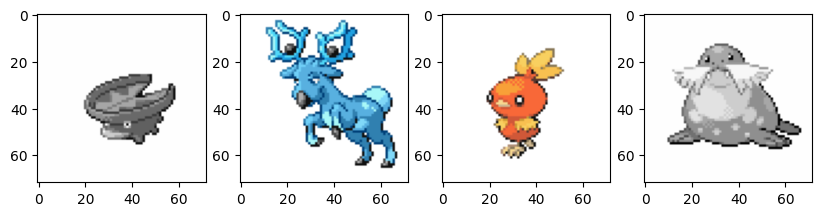

In [4]:
transform = v2.Compose([
    v2.Pad(6, 1.0),
    v2.RandomCrop((64+6, 64+6)),
    v2.Pad(1, 1.0),
    v2.RandomApply([v2.ColorJitter()], 0.1),
    v2.RandomApply([v2.RandomChannelPermutation()], 0.1),
    v2.RandomGrayscale(p = 0.1),
])

source = randint(0, 2)
batch = torch.randperm(385)[:4]
x0 = pimages[source, batch]
x0 = torch.stack([transform(x) for x in x0], dim=0)

fig, axes = plt.subplots(1, 4, figsize=(10, 10))
plot_image(x0[0], axes[0])
plot_image(x0[1], axes[1])
plot_image(x0[2], axes[2])
plot_image(x0[3], axes[3])
plt.show()

In [5]:
def isigmoid(x):
    eps = 0.05
    return torch.log(x + eps) - torch.log(1 - x + eps)

In [6]:
model = UNet_conditional(3, 3, time_dim=512, num_classes=len(all_types) + 1).to(device)

@torch.no_grad
def generate_image():
    model.eval()

    N = 3
    
    #A = torch.tensor([300, 300, 300], device=device)
    #x0 = pimages[1, [0,151,251]]
    #x0 = torch.stack([transform(x) for x in x0], dim=0)
    #x0 = isigmoid(x0)
    #z = torch.randn_like(x0)
    #x = torch.sqrt(alpha_[A])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[A])[:, None, None, None] * z

    x = torch.randn((N, 3, 72, 72), device=device)
    
    ty = [["Dark"], ["Fairy"], ["Electric"]]
    ty = torch.tensor([get_index(t) for t in ty], device=device)
    
    for t in reversed(range(T)):
        tt = torch.tensor([t] * N, device=device)

        z = torch.randn_like(x)
        if t == 0:
            z *= 0

        #x0 = model(x, tt)
        #x = torch.sqrt(alpha_[t]) * x0 + torch.sqrt(1-alpha_[t]) * z

        e = model(x, tt, ty) * (1 - alpha[t]) / torch.sqrt(1 - alpha_[t])
        x = (1 / torch.sqrt(alpha[t])) * (x - e) + z * torch.sqrt(beta[t])

        #clear_output(wait=True)
        #fig, axes = plt.subplots(1, N, figsize=(10, 10))
        #for i in range(N):
        #    plot_image(torch.sigmoid(x-e)[i], axes[i])
        #plt.show()

    x = torch.sigmoid(x)
    
    fig, axes = plt.subplots(1, N, figsize=(10, 10))
    for i in range(N):
        plot_image(x[i], axes[i])
    plt.show()

    model.train()

In [7]:
#sd = torch.load("model.pt")
#model.load_state_dict(sd)

#generate_image()

  0%|          | 0/250001 [00:00<?, ?it/s]

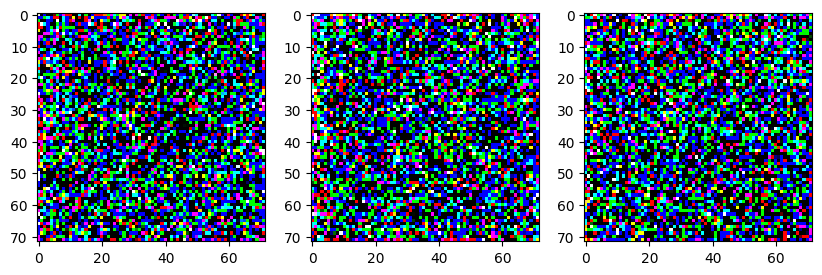

0.06990335:   1%|          | 1997/250001 [01:07<2:12:11, 31.27it/s]

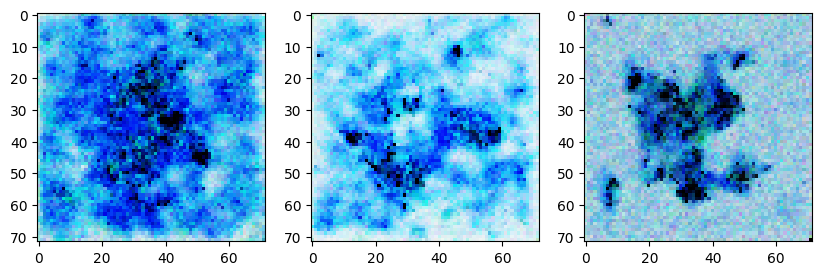

0.03761850:   2%|▏         | 3997/250001 [02:14<2:10:49, 31.34it/s] 

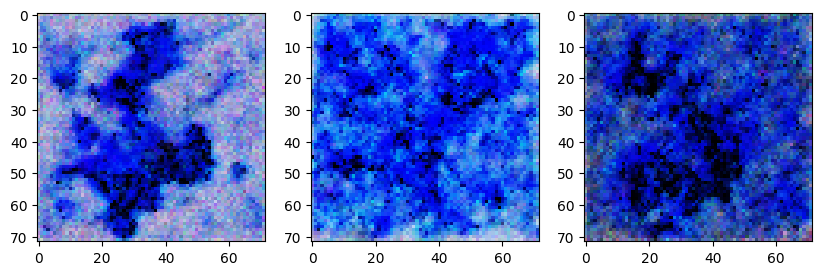

0.05835800:   2%|▏         | 5997/250001 [03:21<2:10:04, 31.26it/s] 

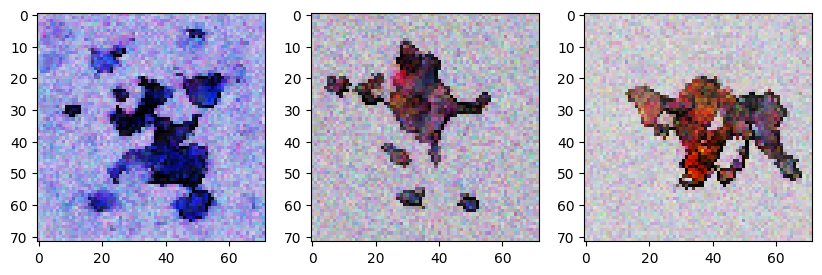

0.02951731:   3%|▎         | 7997/250001 [04:28<2:08:48, 31.31it/s] 

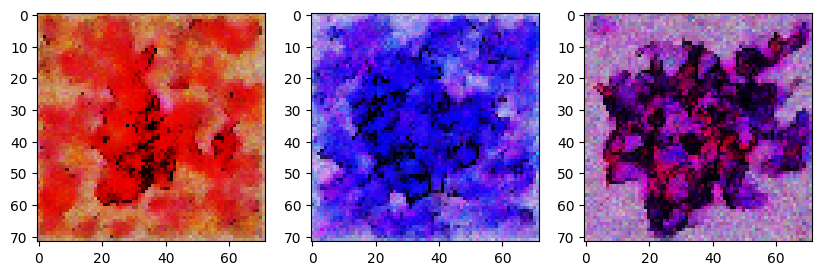

0.04230207:   4%|▍         | 9997/250001 [05:35<2:07:37, 31.34it/s] 

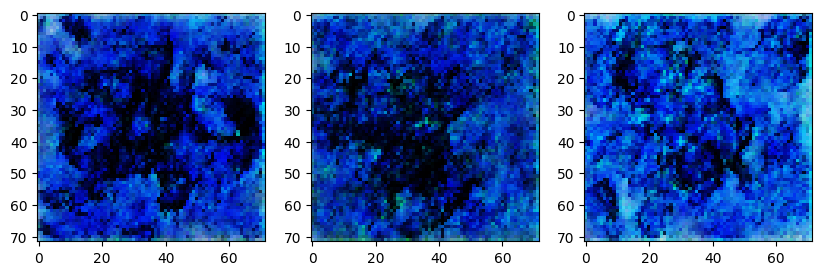

0.03748435:   5%|▍         | 12000/250001 [06:42<2:06:43, 31.30it/s] 

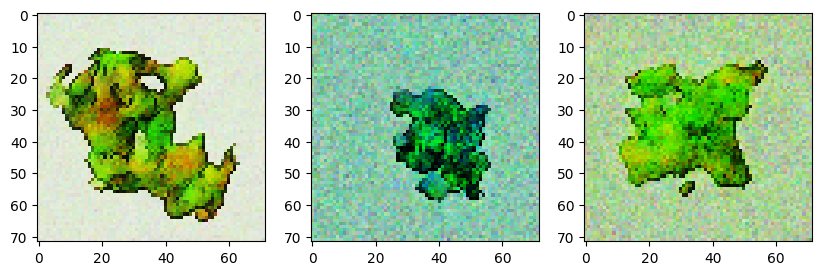

0.04180498:   6%|▌         | 14000/250001 [07:49<2:05:34, 31.32it/s] 

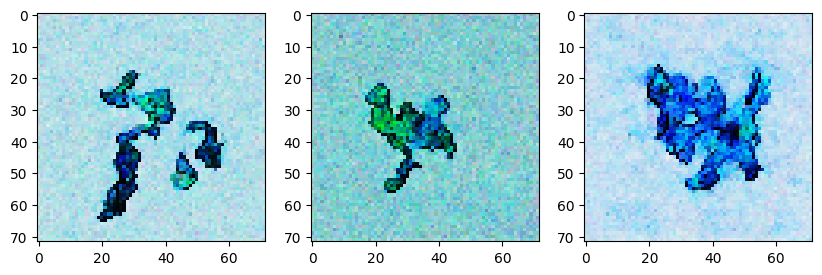

0.02996778:   6%|▋         | 16000/250001 [08:56<2:04:26, 31.34it/s] 

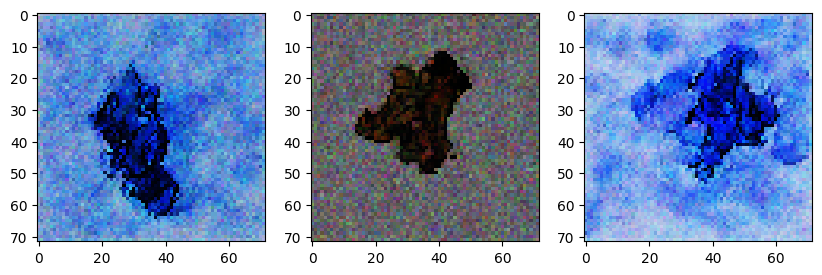

0.03340614:   7%|▋         | 18000/250001 [10:03<2:03:13, 31.38it/s] 

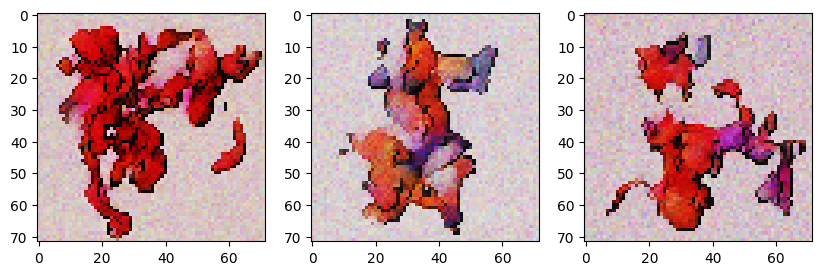

0.03717226:   8%|▊         | 20000/250001 [11:10<2:02:18, 31.34it/s] 

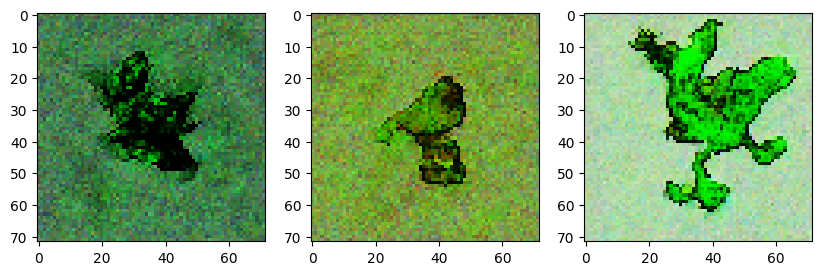

0.02917989:   9%|▉         | 22000/250001 [12:17<2:01:12, 31.35it/s] 

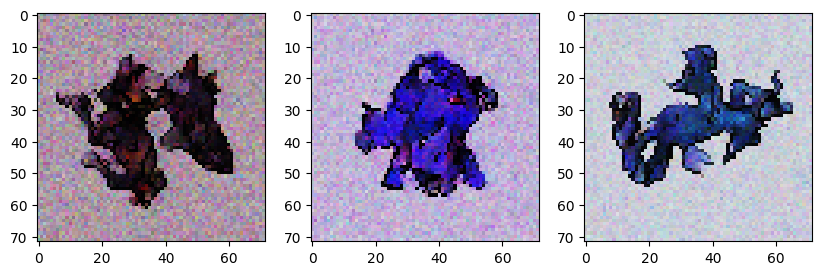

0.04306649:  10%|▉         | 24000/250001 [13:24<2:00:12, 31.33it/s] 

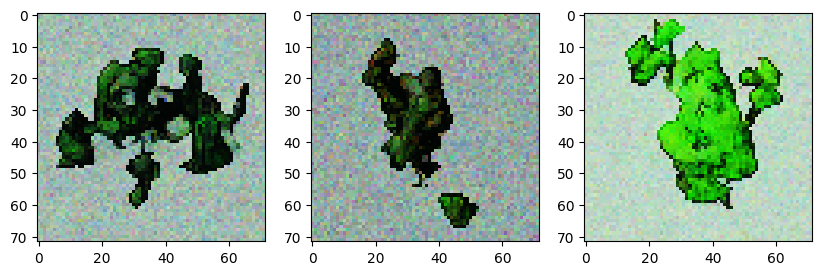

0.01276868:  10%|█         | 26000/250001 [14:32<1:59:05, 31.35it/s] 

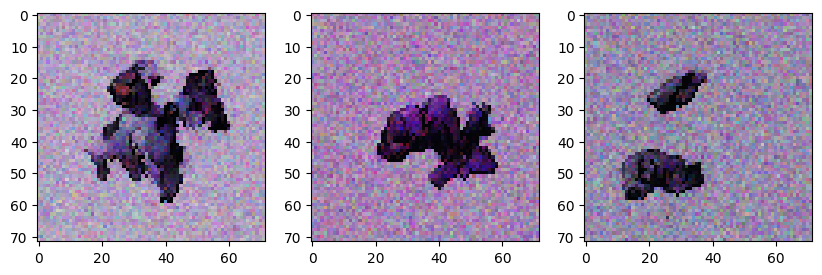

0.01920188:  11%|█         | 28000/250001 [15:39<1:57:59, 31.36it/s] 

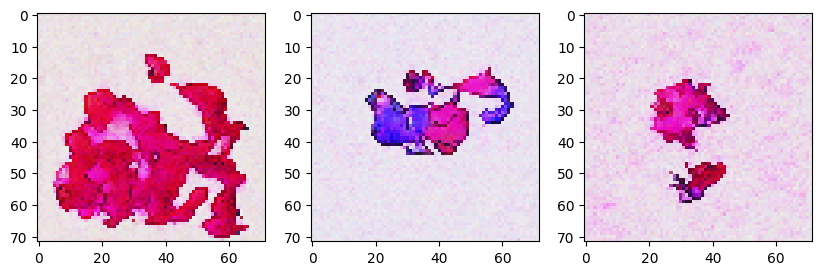

0.02924962:  12%|█▏        | 30000/250001 [16:46<1:56:59, 31.34it/s] 

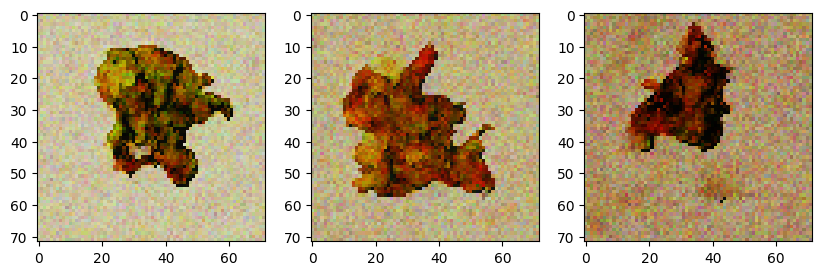

0.05128516:  13%|█▎        | 32000/250001 [17:53<1:56:01, 31.32it/s] 

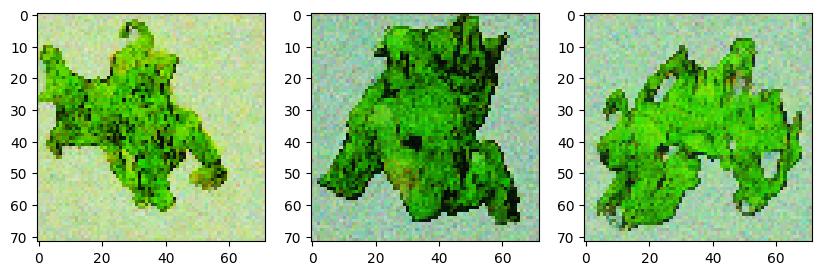

0.00745646:  14%|█▎        | 34000/250001 [19:00<1:54:56, 31.32it/s] 

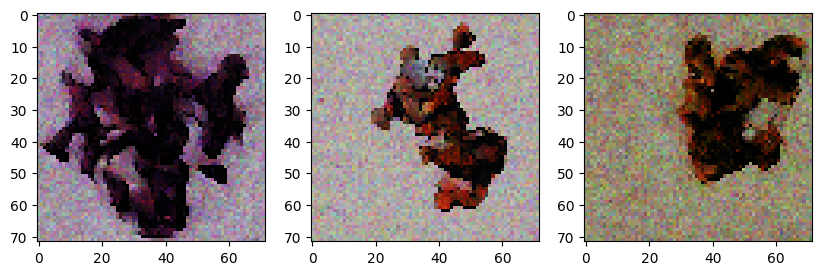

0.03409754:  14%|█▍        | 36000/250001 [20:07<1:53:50, 31.33it/s] 

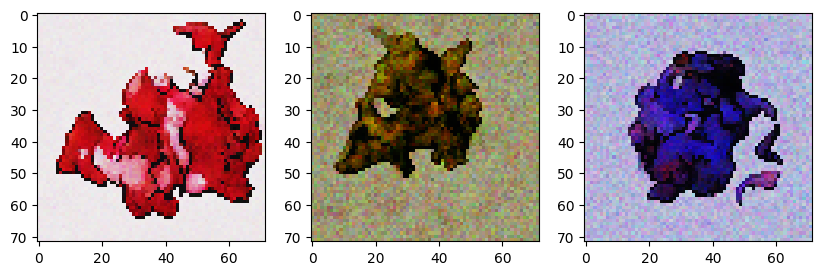

0.03419808:  15%|█▌        | 38000/250001 [21:14<1:52:30, 31.40it/s] 

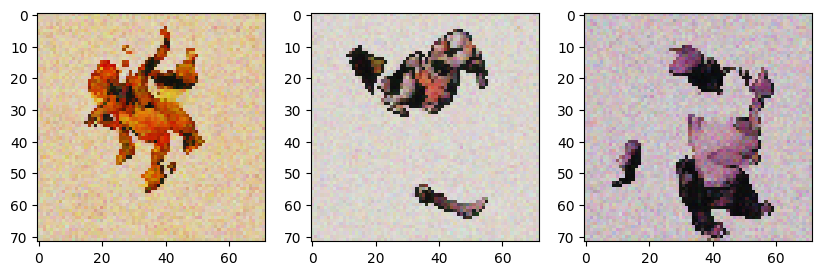

0.02258015:  16%|█▌        | 40000/250001 [22:21<1:51:41, 31.34it/s] 

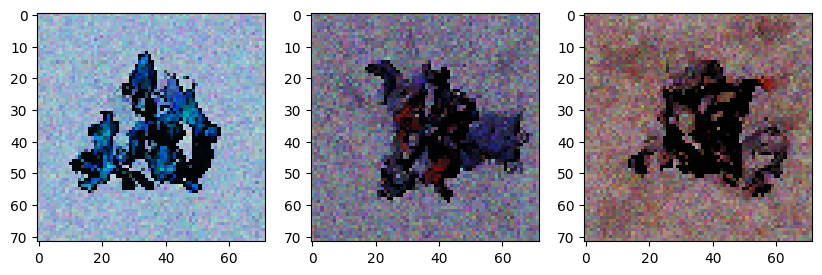

0.02911688:  17%|█▋        | 42000/250001 [23:28<1:50:37, 31.34it/s] 

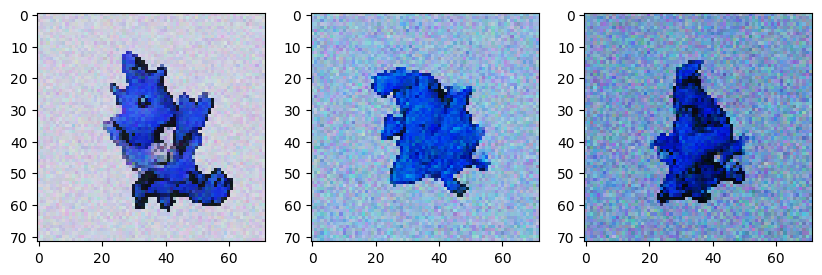

0.02771346:  18%|█▊        | 44000/250001 [24:35<1:49:34, 31.34it/s] 

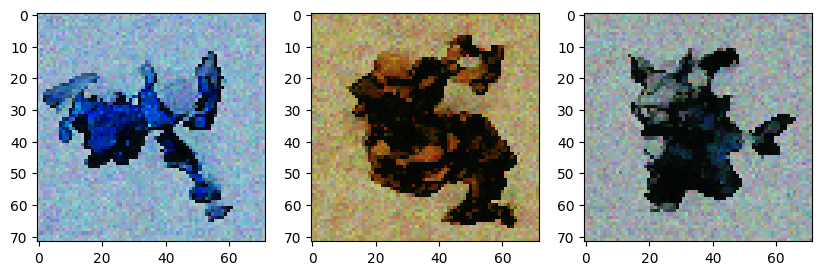

0.02265327:  18%|█▊        | 46000/250001 [25:42<1:48:25, 31.36it/s] 

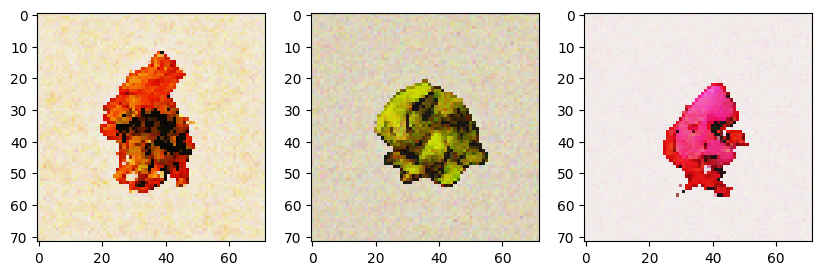

0.04159956:  19%|█▉        | 48000/250001 [26:49<1:47:22, 31.35it/s] 

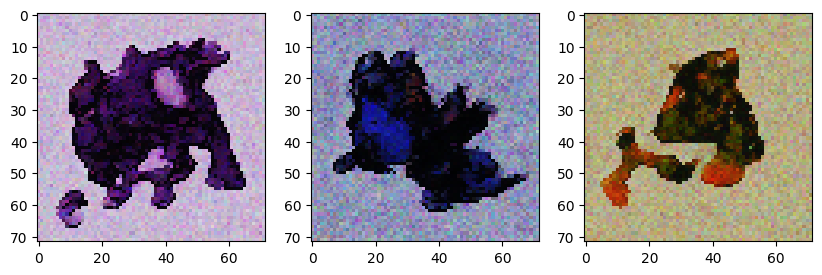

0.02280169:  20%|█▉        | 50000/250001 [27:56<1:46:24, 31.32it/s] 

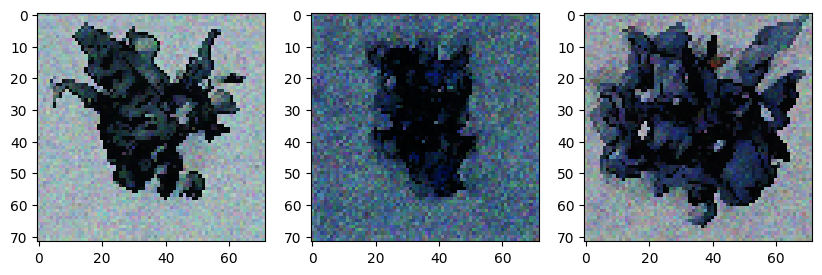

0.02336955:  21%|██        | 52000/250001 [29:03<1:45:23, 31.31it/s] 

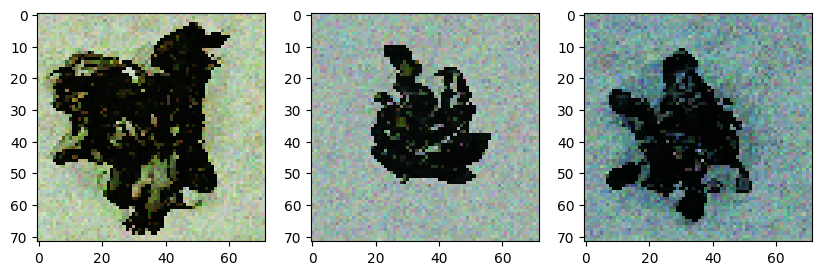

0.01850191:  22%|██▏       | 54000/250001 [30:10<1:44:16, 31.33it/s] 

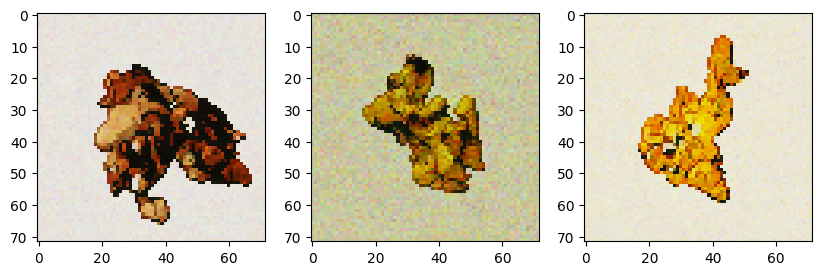

0.03280207:  22%|██▏       | 56000/250001 [31:17<1:42:58, 31.40it/s] 

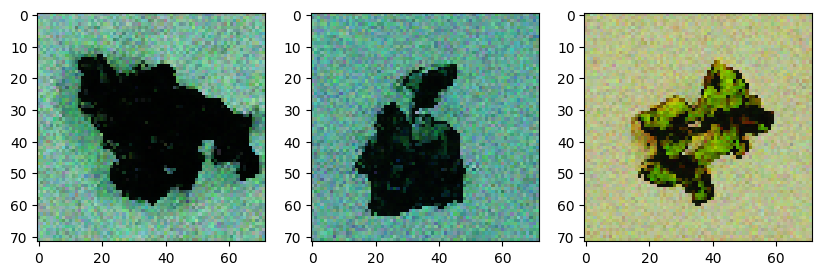

0.01673323:  23%|██▎       | 58000/250001 [32:24<1:41:58, 31.38it/s] 

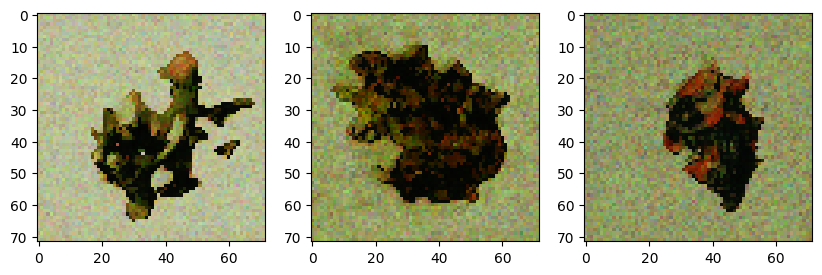

0.03540173:  24%|██▍       | 60000/250001 [33:31<1:40:59, 31.35it/s] 

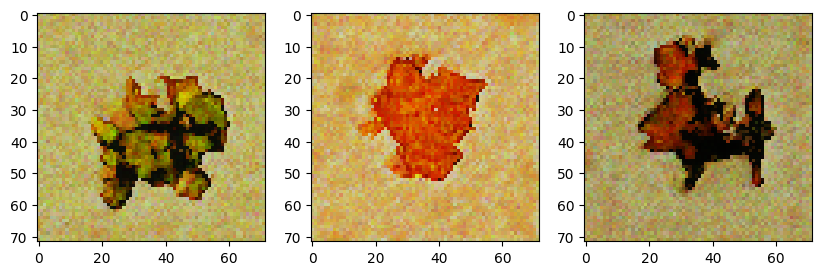

0.01729628:  25%|██▍       | 62000/250001 [34:38<1:39:57, 31.35it/s] 

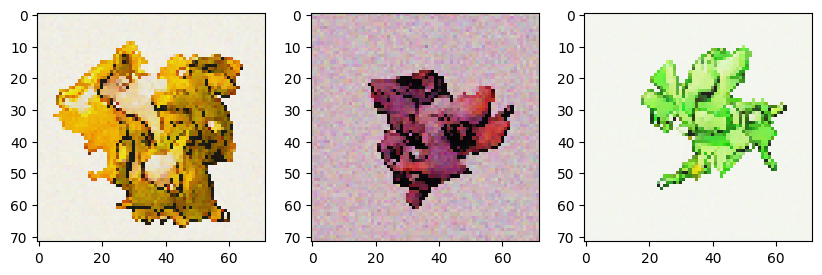

0.01799688:  26%|██▌       | 64000/250001 [35:46<1:39:07, 31.27it/s] 

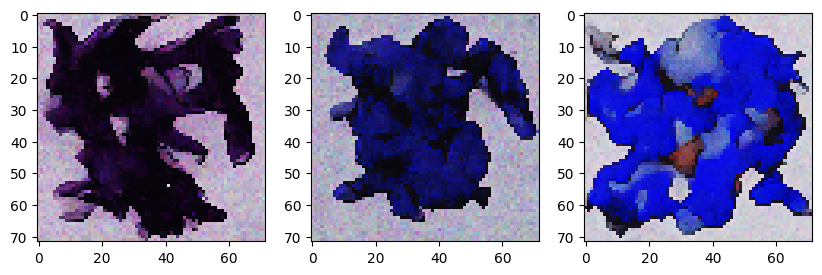

0.02389328:  26%|██▋       | 66000/250001 [36:53<1:37:52, 31.33it/s] 

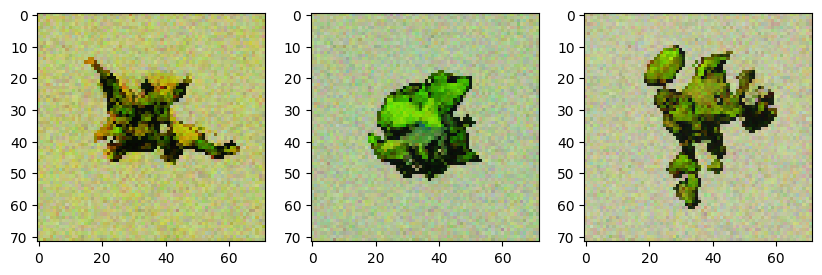

0.02613134:  27%|██▋       | 68000/250001 [38:00<1:36:57, 31.28it/s] 

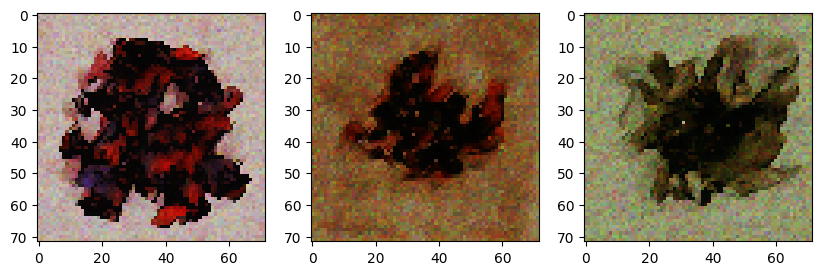

0.02863322:  28%|██▊       | 70000/250001 [39:07<1:35:48, 31.31it/s] 

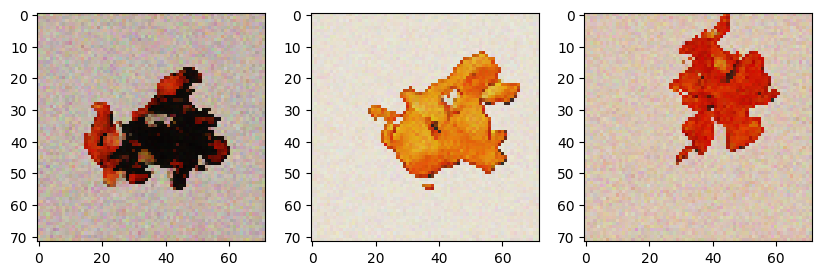

0.02122818:  29%|██▉       | 72000/250001 [40:14<1:34:30, 31.39it/s] 

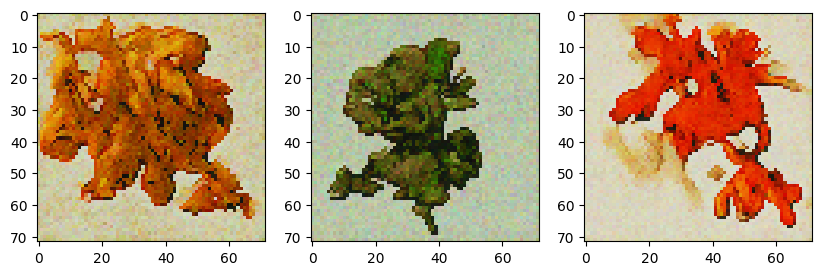

0.03073393:  30%|██▉       | 74000/250001 [41:21<1:33:57, 31.22it/s] 

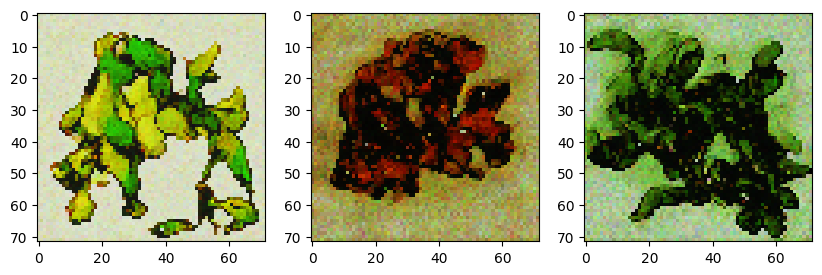

0.01324701:  30%|███       | 76000/250001 [42:28<1:32:48, 31.25it/s] 

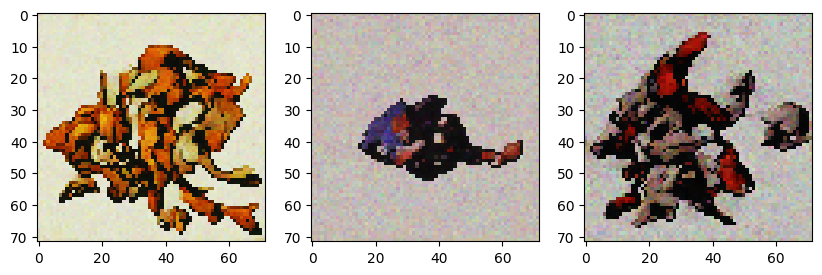

0.02140523:  31%|███       | 78000/250001 [43:35<1:31:16, 31.40it/s] 

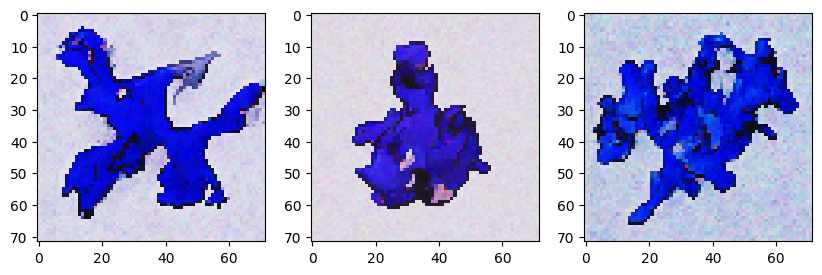

0.01785739:  32%|███▏      | 80000/250001 [44:42<1:30:16, 31.39it/s] 

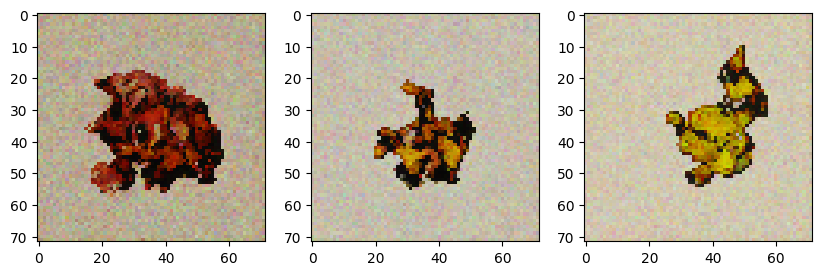

0.01693443:  33%|███▎      | 82000/250001 [45:49<1:29:16, 31.37it/s] 

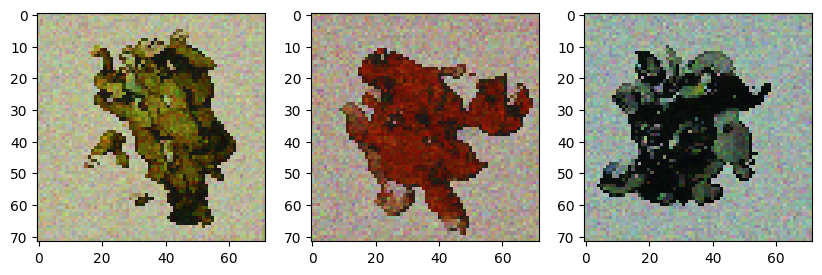

0.04498164:  34%|███▎      | 84000/250001 [46:56<1:28:15, 31.35it/s] 

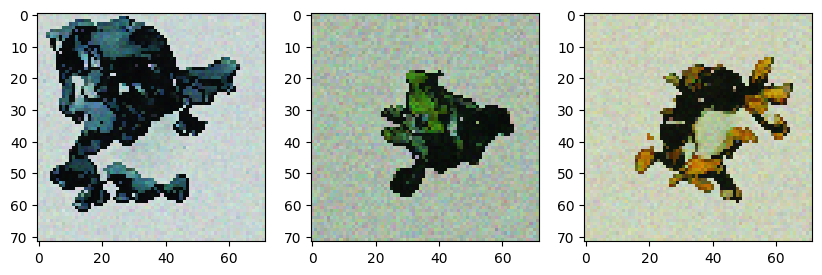

0.03591713:  34%|███▍      | 86000/250001 [48:03<1:27:16, 31.32it/s] 

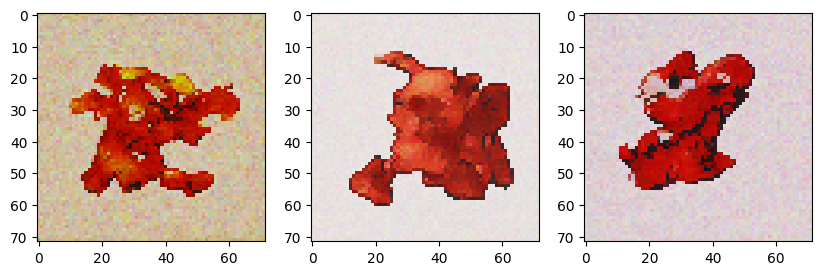

0.02841958:  35%|███▌      | 88000/250001 [49:10<1:26:06, 31.35it/s] 

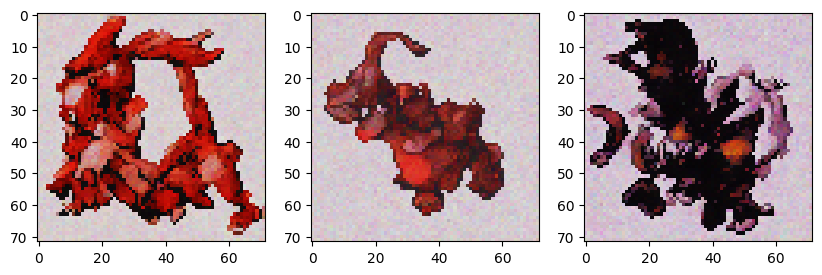

0.02202508:  36%|███▌      | 90000/250001 [50:17<1:25:08, 31.32it/s] 

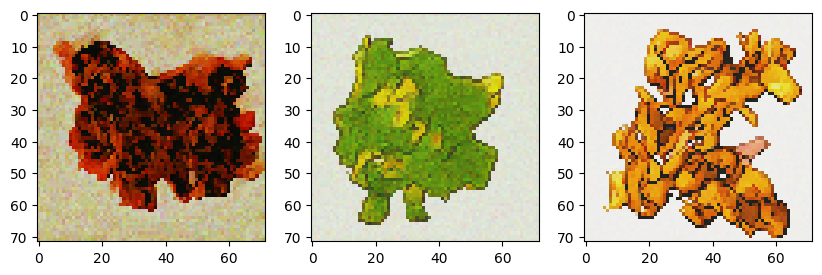

0.03414671:  37%|███▋      | 92000/250001 [51:24<1:23:52, 31.39it/s] 

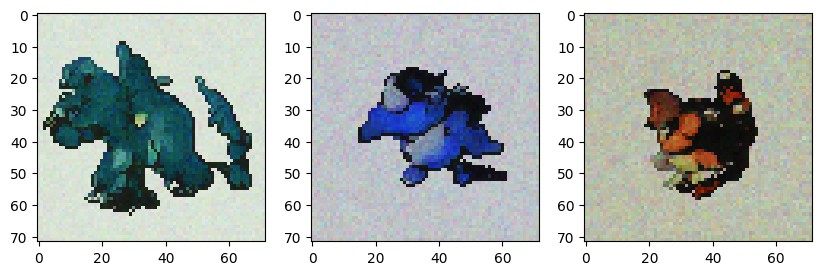

0.01824166:  38%|███▊      | 94000/250001 [52:31<1:23:02, 31.31it/s] 

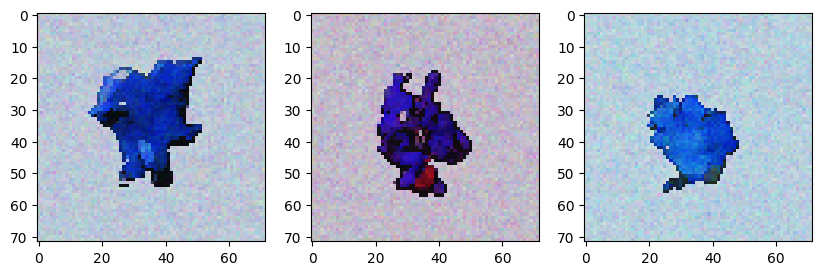

0.01755815:  38%|███▊      | 96000/250001 [53:38<1:21:58, 31.31it/s] 

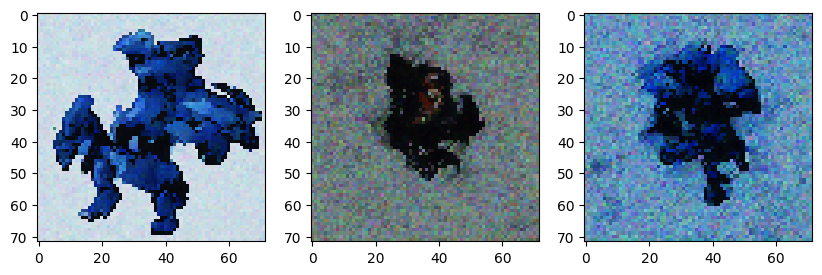

0.01885461:  39%|███▉      | 98000/250001 [54:46<1:20:50, 31.34it/s] 

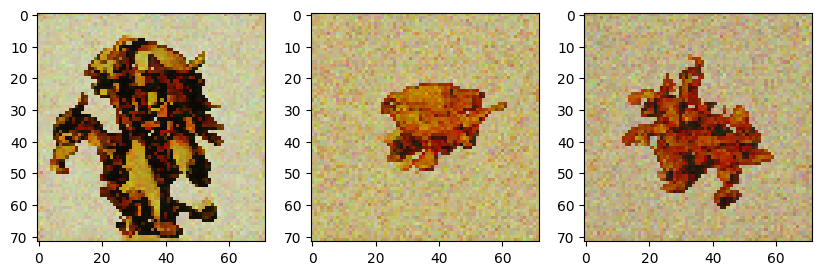

0.03415428:  40%|███▉      | 100000/250001 [55:53<1:19:41, 31.37it/s]

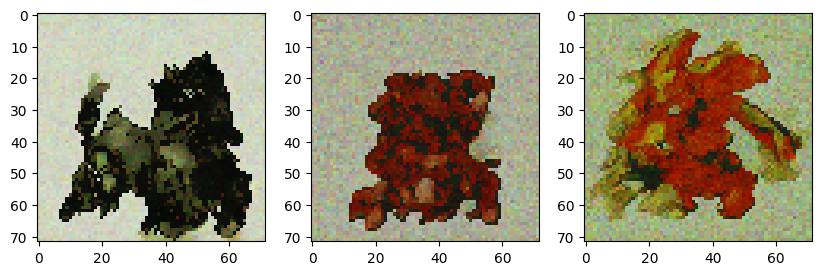

0.02721469:  41%|████      | 102000/250001 [57:00<1:18:56, 31.24it/s] 

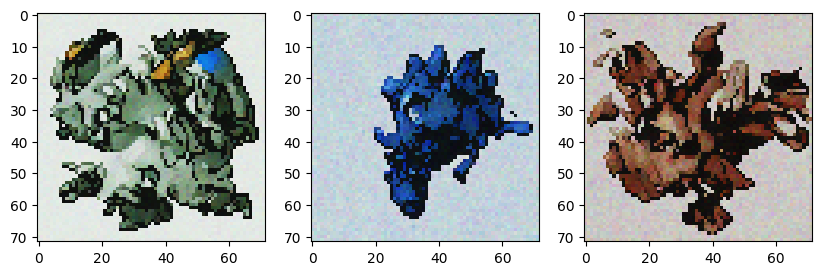

0.02345469:  42%|████▏     | 104000/250001 [58:07<1:17:33, 31.37it/s] 

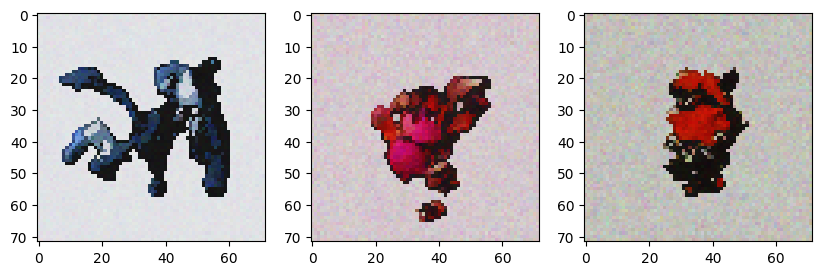

0.03301622:  42%|████▏     | 106000/250001 [59:14<1:16:35, 31.33it/s] 

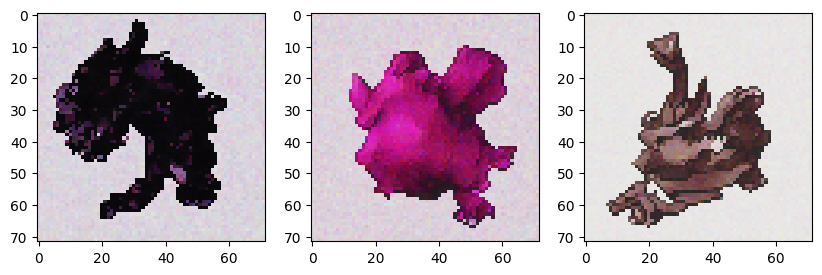

0.02819417:  43%|████▎     | 108000/250001 [1:00:21<1:15:26, 31.37it/s]

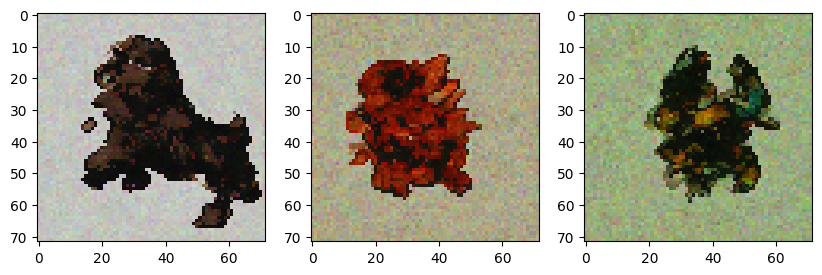

0.01314246:  44%|████▍     | 110000/250001 [1:01:28<1:14:28, 31.33it/s] 

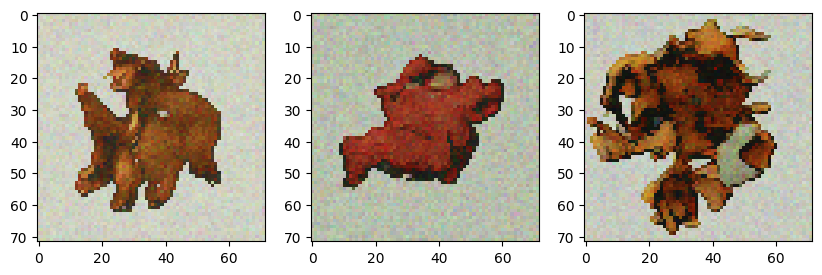

0.02356640:  45%|████▍     | 112000/250001 [1:02:35<1:13:17, 31.38it/s] 

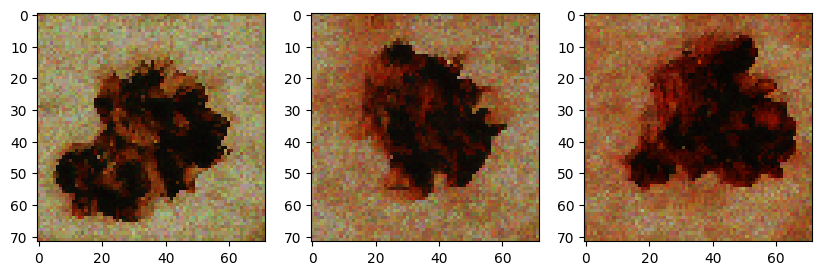

0.01449568:  46%|████▌     | 114000/250001 [1:03:42<1:12:02, 31.46it/s] 

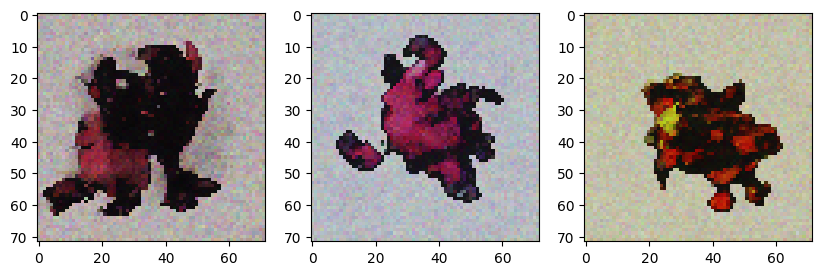

0.02267984:  46%|████▋     | 116000/250001 [1:04:49<1:11:12, 31.37it/s] 

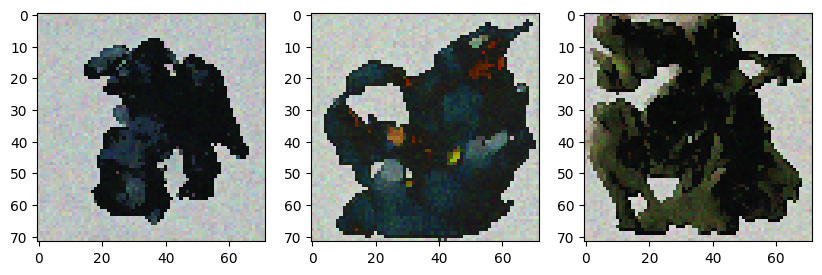

0.01801615:  47%|████▋     | 118000/250001 [1:05:56<1:10:11, 31.34it/s] 

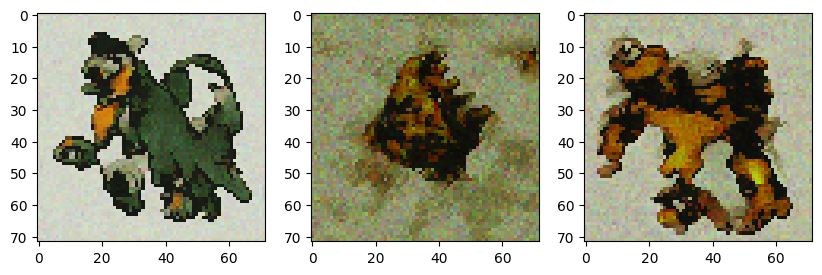

0.02286512:  48%|████▊     | 120000/250001 [1:07:03<1:09:08, 31.34it/s] 

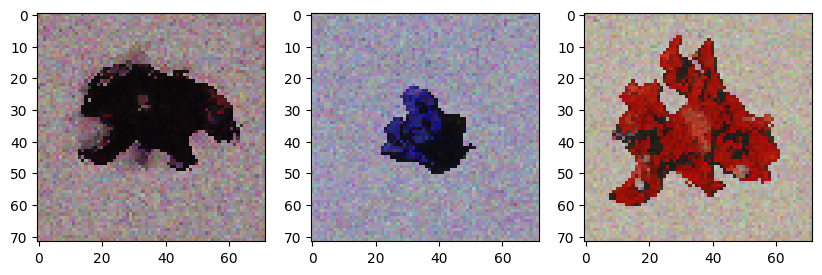

0.01452396:  49%|████▉     | 122000/250001 [1:08:10<1:07:59, 31.38it/s]

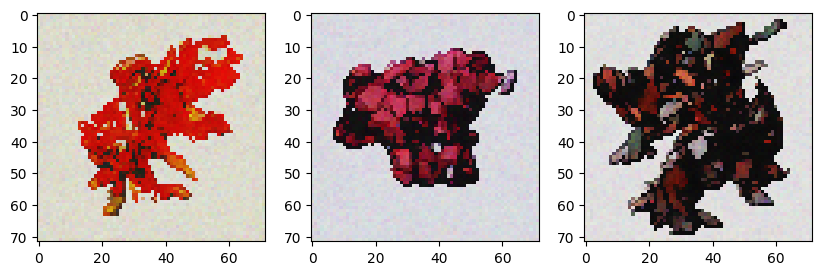

0.02945728:  50%|████▉     | 124000/250001 [1:09:17<1:06:54, 31.39it/s]

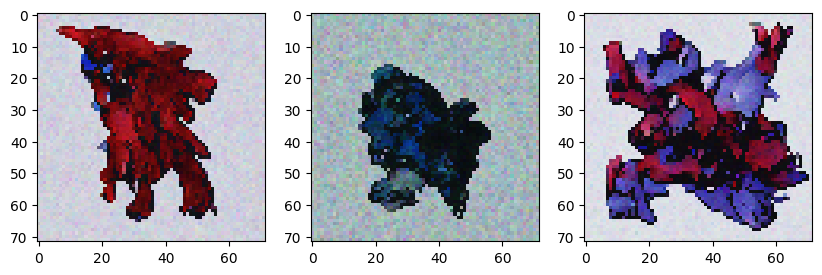

0.01996124:  50%|█████     | 126000/250001 [1:10:24<1:05:54, 31.36it/s]

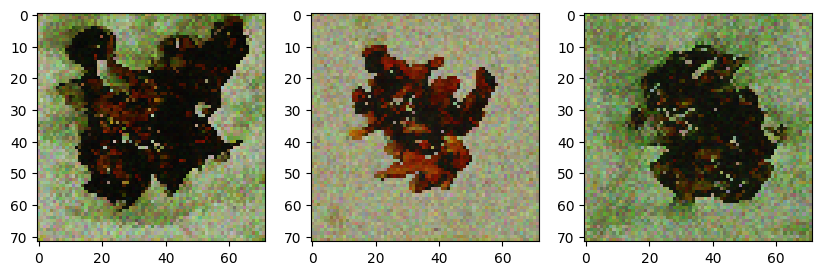

0.02173156:  51%|█████     | 128000/250001 [1:11:31<1:04:56, 31.31it/s]

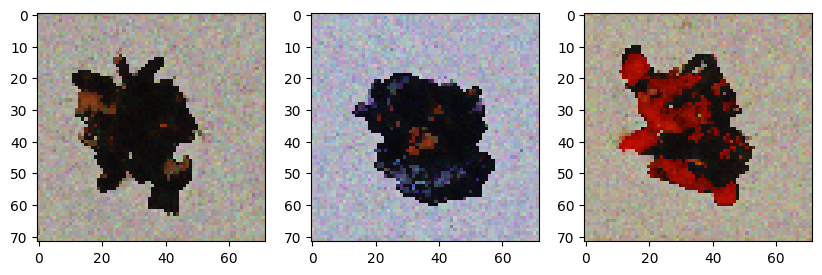

0.02365771:  52%|█████▏    | 130000/250001 [1:12:38<1:03:46, 31.36it/s]

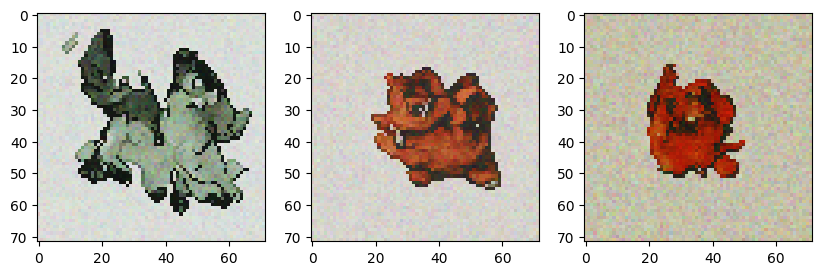

0.02695858:  53%|█████▎    | 132000/250001 [1:13:45<1:02:44, 31.35it/s]

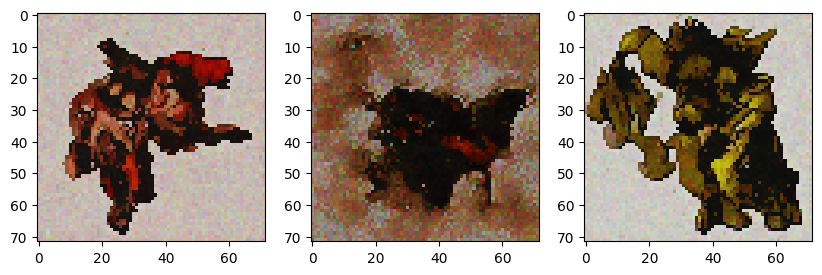

0.01869472:  54%|█████▎    | 134000/250001 [1:14:52<1:01:40, 31.35it/s]

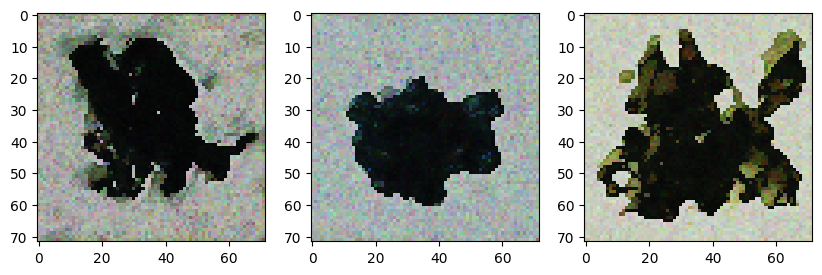

0.02527961:  54%|█████▍    | 136000/250001 [1:15:59<1:00:39, 31.32it/s]

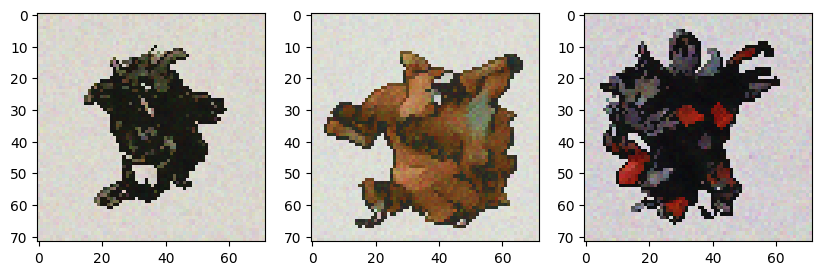

0.00819146:  55%|█████▌    | 138000/250001 [1:17:06<59:35, 31.32it/s]  

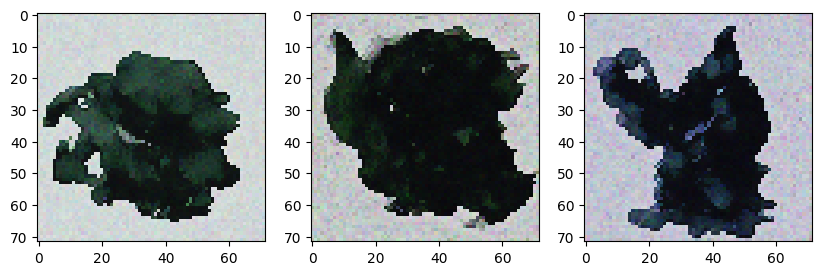

0.01601294:  56%|█████▌    | 140000/250001 [1:18:14<58:37, 31.27it/s]  

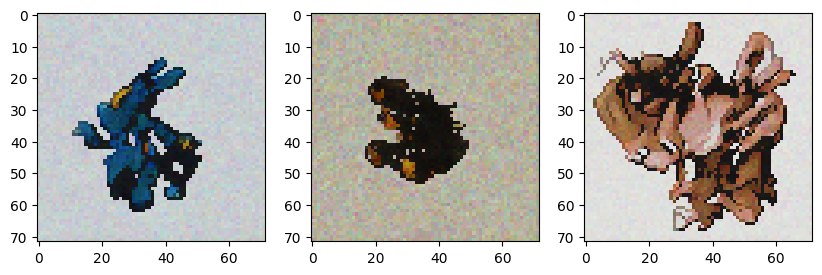

0.01733818:  57%|█████▋    | 142000/250001 [1:19:21<57:20, 31.39it/s]  

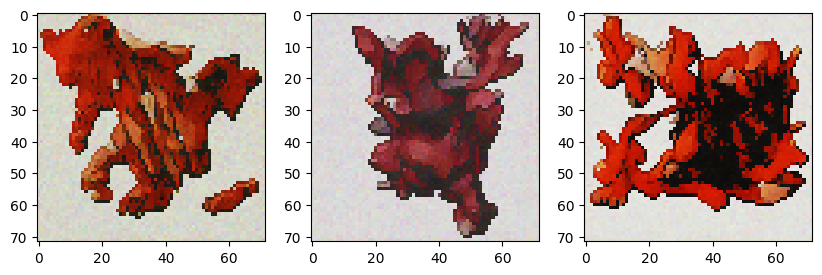

0.02505219:  58%|█████▊    | 144000/250001 [1:20:28<56:31, 31.25it/s]  

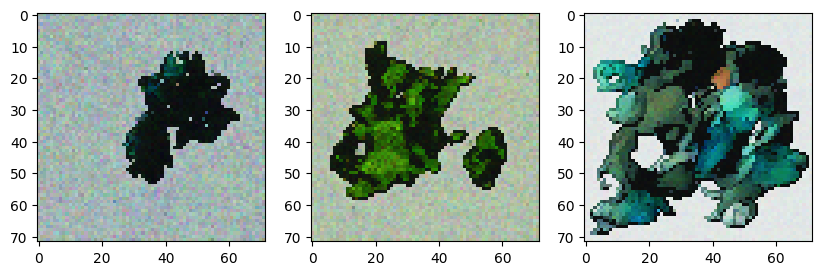

0.03395212:  58%|█████▊    | 146000/250001 [1:21:35<55:24, 31.28it/s]  

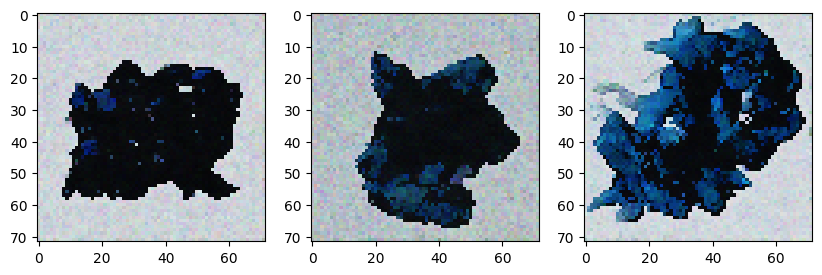

0.01825154:  59%|█████▉    | 148000/250001 [1:22:42<54:32, 31.17it/s]  

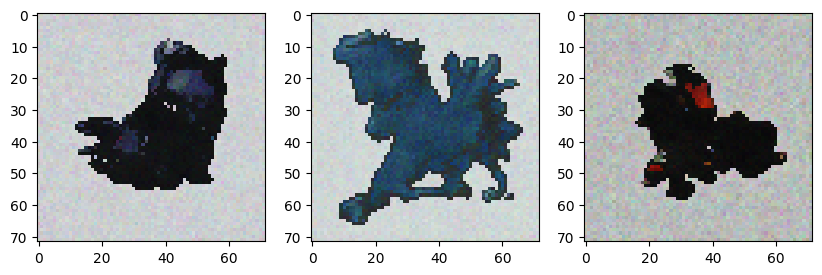

0.02680451:  60%|█████▉    | 150000/250001 [1:23:49<53:05, 31.40it/s]  

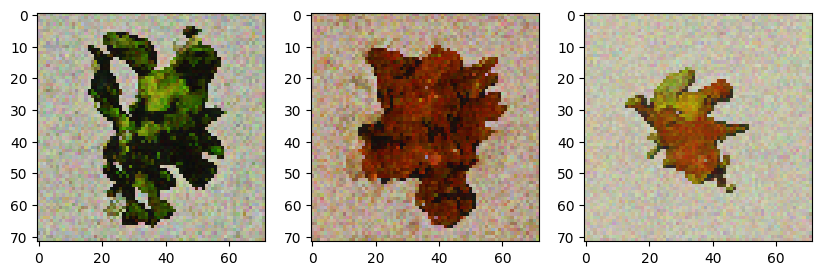

0.01788105:  61%|██████    | 152000/250001 [1:24:56<52:05, 31.36it/s]  

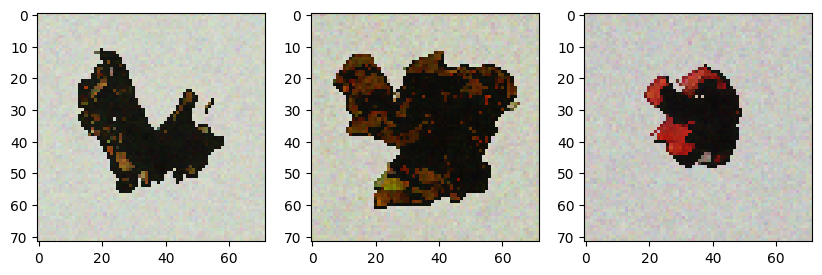

0.02140714:  62%|██████▏   | 154000/250001 [1:26:03<51:07, 31.30it/s]  

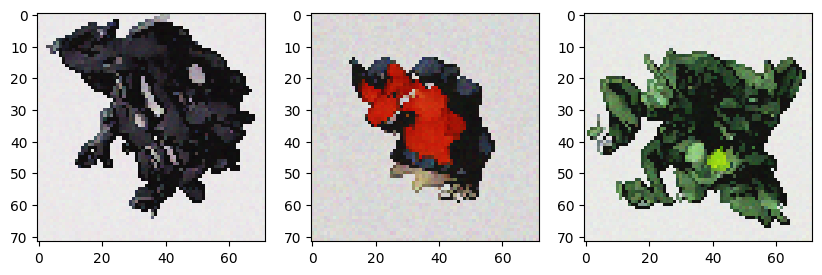

0.02320717:  62%|██████▏   | 156000/250001 [1:27:10<49:51, 31.42it/s]  

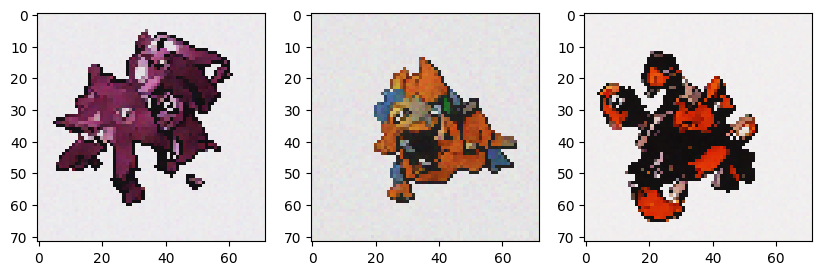

0.02082730:  63%|██████▎   | 158000/250001 [1:28:17<48:57, 31.32it/s]  

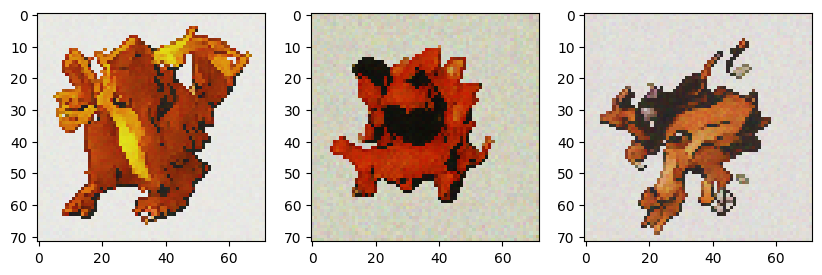

0.01614408:  64%|██████▍   | 160000/250001 [1:29:24<47:51, 31.35it/s]  

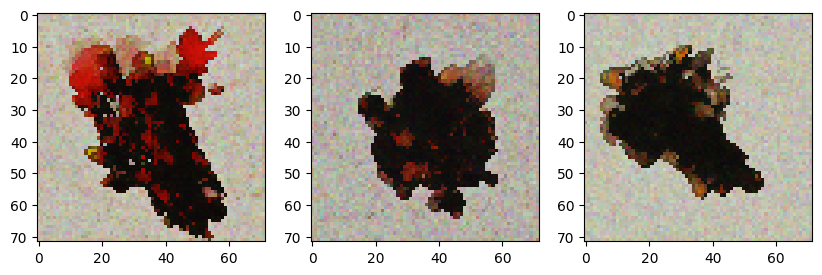

0.01911432:  65%|██████▍   | 162000/250001 [1:30:31<46:51, 31.30it/s]  

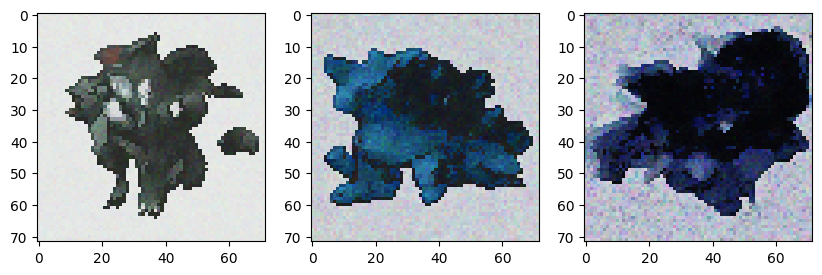

0.02821035:  66%|██████▌   | 164000/250001 [1:31:38<45:47, 31.31it/s]  

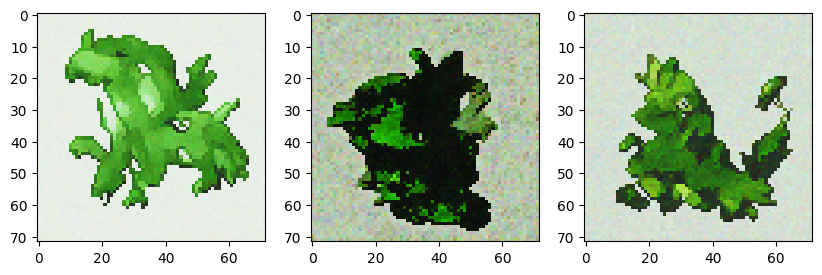

0.03253677:  66%|██████▋   | 166000/250001 [1:32:45<44:33, 31.42it/s]  

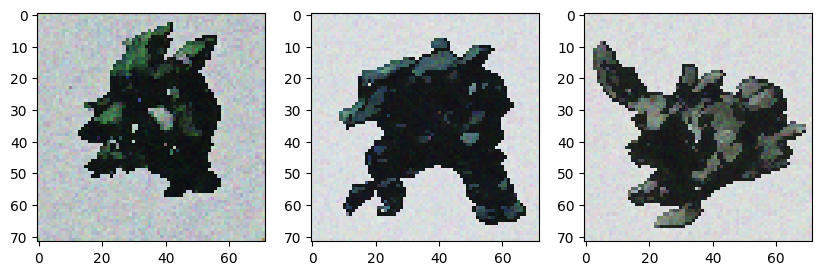

0.02348862:  67%|██████▋   | 168000/250001 [1:33:53<43:36, 31.33it/s]  

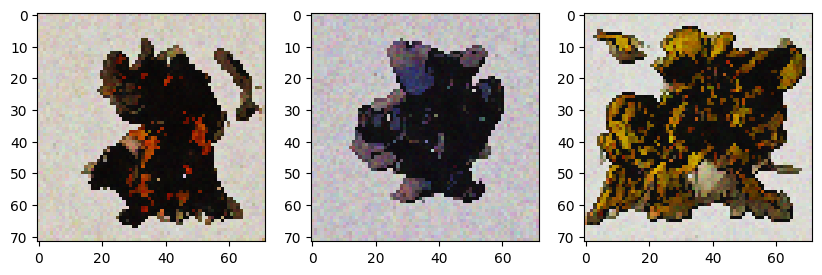

0.03165127:  68%|██████▊   | 170000/250001 [1:35:00<42:35, 31.31it/s]  

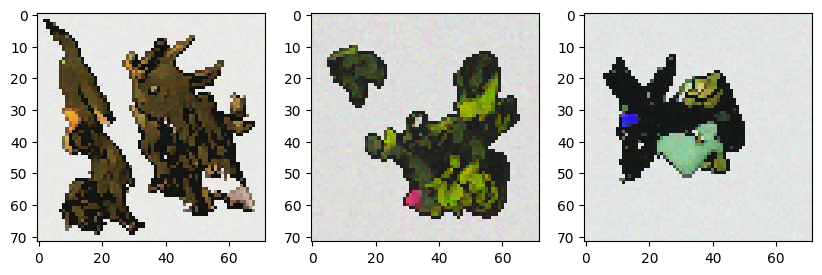

0.02834090:  69%|██████▉   | 172000/250001 [1:36:07<41:27, 31.35it/s]  

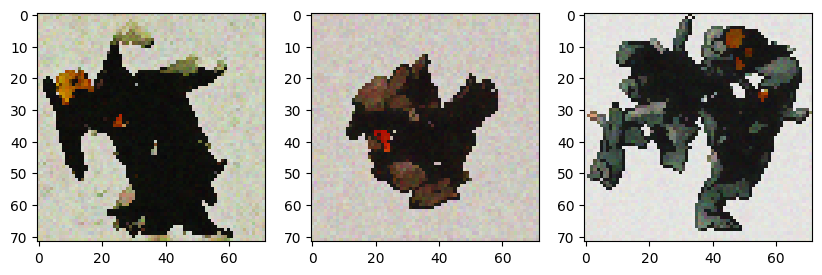

0.01813730:  70%|██████▉   | 174000/250001 [1:37:14<40:25, 31.33it/s]  

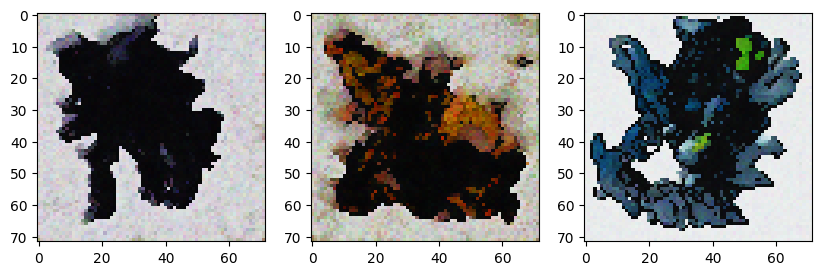

0.01836513:  70%|███████   | 176000/250001 [1:38:21<39:18, 31.37it/s]  

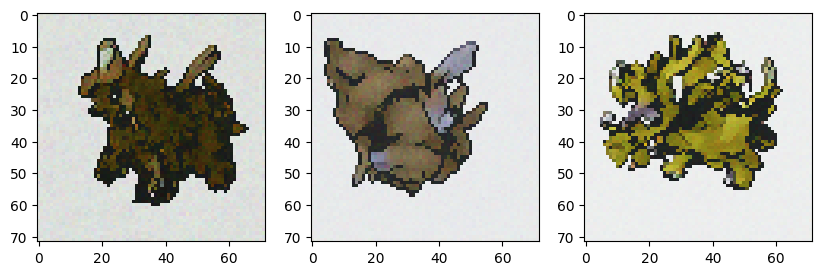

0.00810082:  71%|███████   | 178000/250001 [1:39:28<38:13, 31.39it/s]  

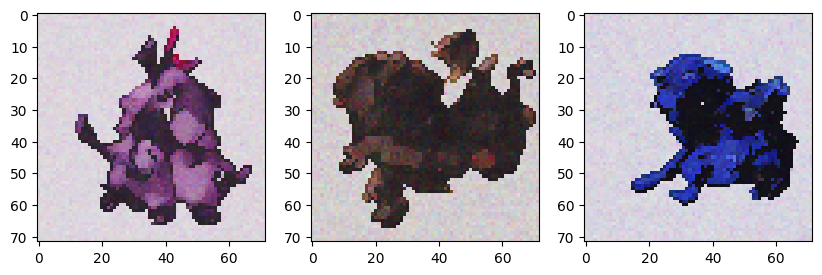

0.00840636:  72%|███████▏  | 180000/250001 [1:40:35<37:11, 31.37it/s]  

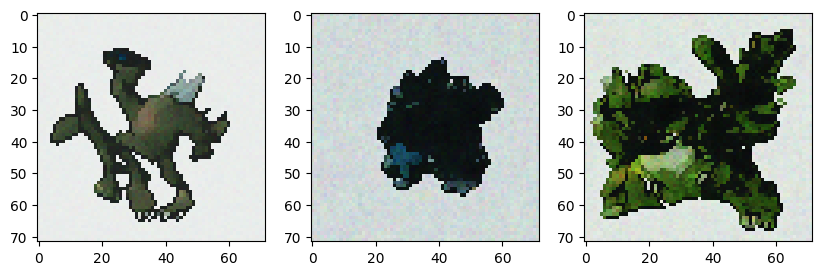

0.02268493:  73%|███████▎  | 182000/250001 [1:41:42<36:14, 31.27it/s]  

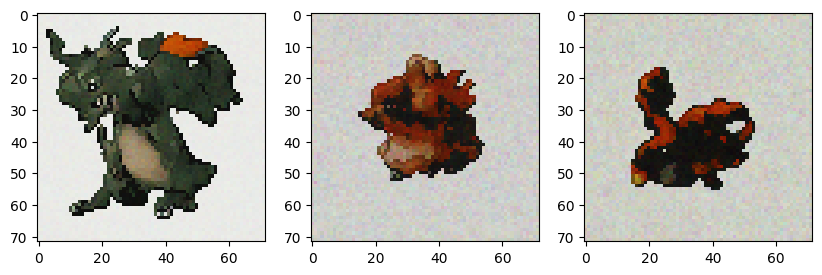

0.02020129:  74%|███████▎  | 184000/250001 [1:42:49<34:58, 31.44it/s]  

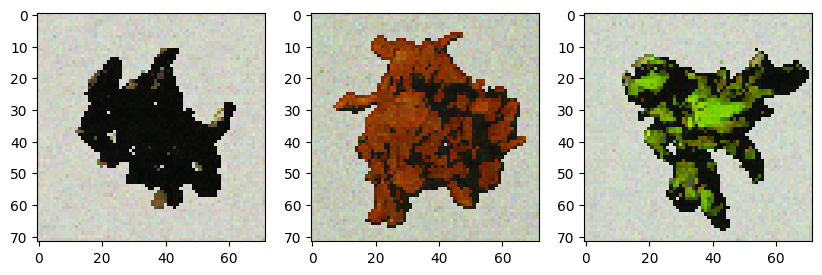

0.01026596:  74%|███████▍  | 186000/250001 [1:43:56<34:03, 31.32it/s]  

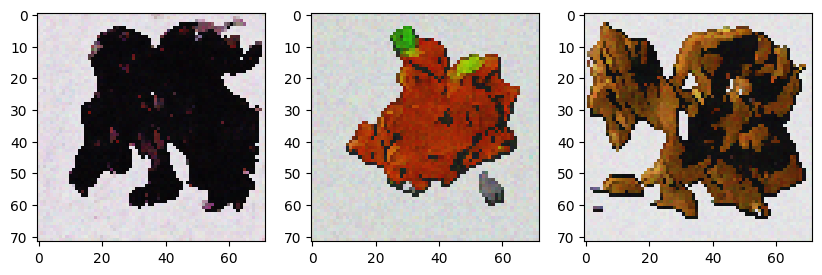

0.02194802:  75%|███████▌  | 188000/250001 [1:45:03<32:57, 31.35it/s]  

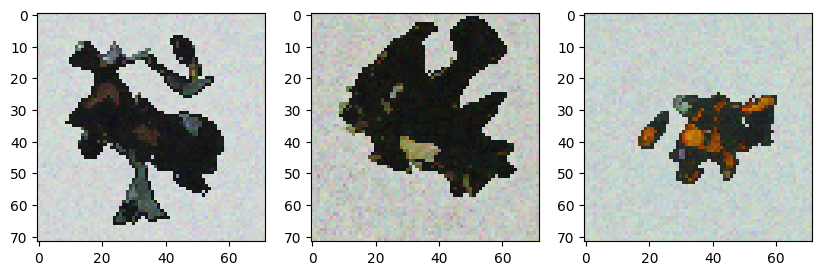

0.03084918:  76%|███████▌  | 190000/250001 [1:46:10<31:53, 31.36it/s]  

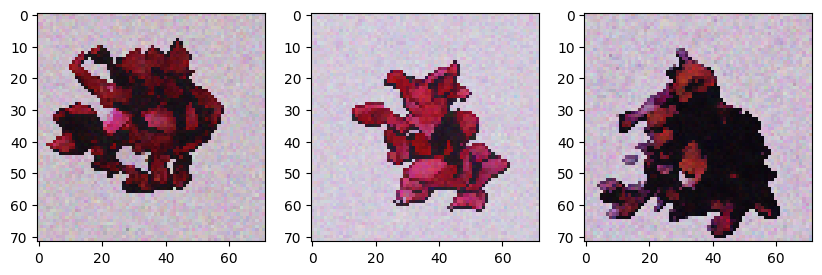

0.02598155:  77%|███████▋  | 192000/250001 [1:47:17<30:56, 31.24it/s]  

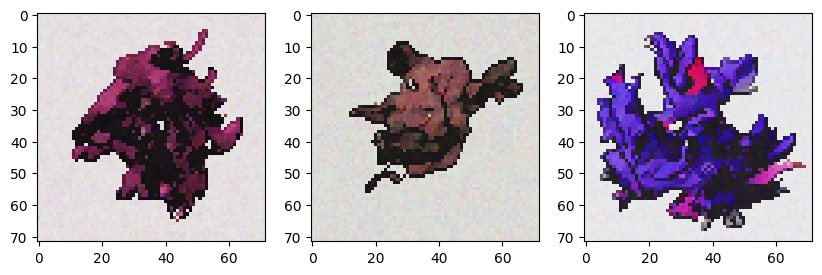

0.00999385:  78%|███████▊  | 194000/250001 [1:48:24<29:41, 31.44it/s]  

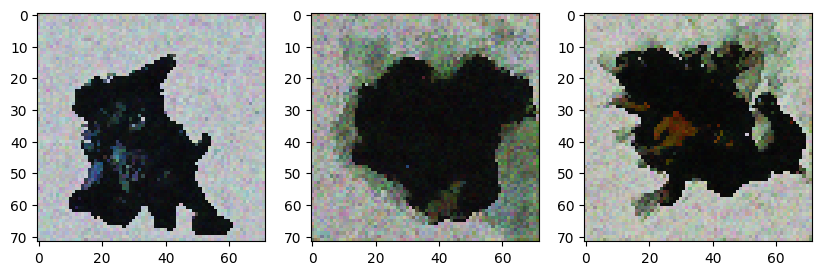

0.01757844:  78%|███████▊  | 196000/250001 [1:49:31<28:41, 31.36it/s]  

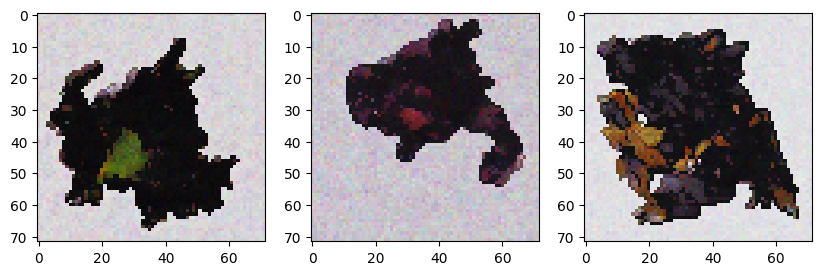

0.00992815:  79%|███████▉  | 198000/250001 [1:50:38<27:34, 31.42it/s]  

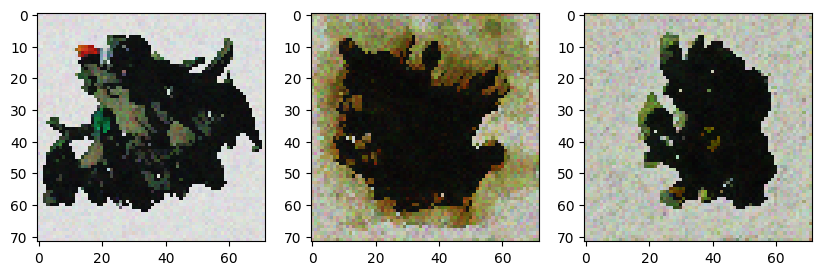

0.03110479:  80%|███████▉  | 200000/250001 [1:51:45<26:35, 31.34it/s]  

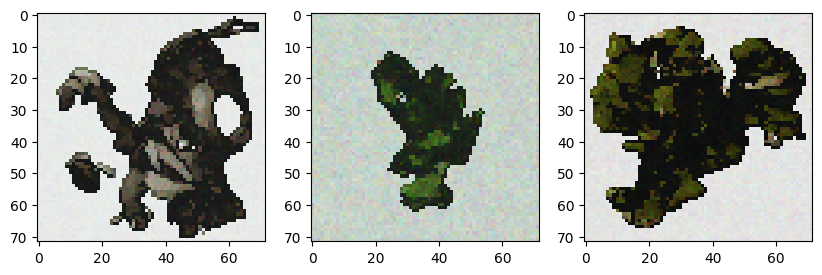

0.02750339:  81%|████████  | 201999/250001 [1:52:52<25:31, 31.34it/s]  

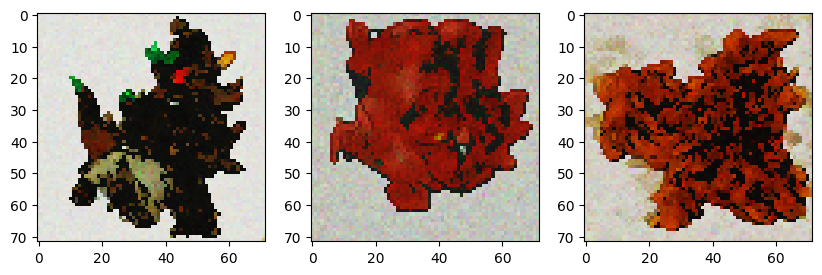

0.01670311:  82%|████████▏ | 203999/250001 [1:53:59<24:28, 31.32it/s]  

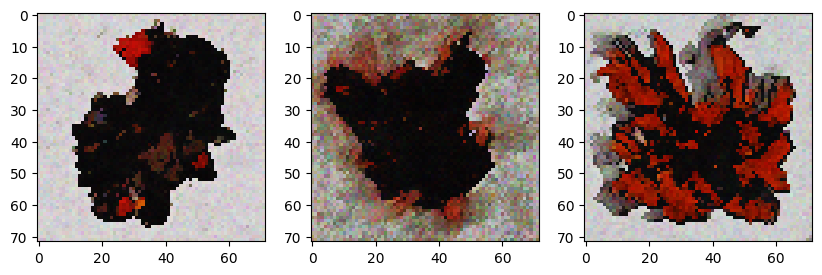

0.01920585:  82%|████████▏ | 205999/250001 [1:55:06<23:24, 31.33it/s]  

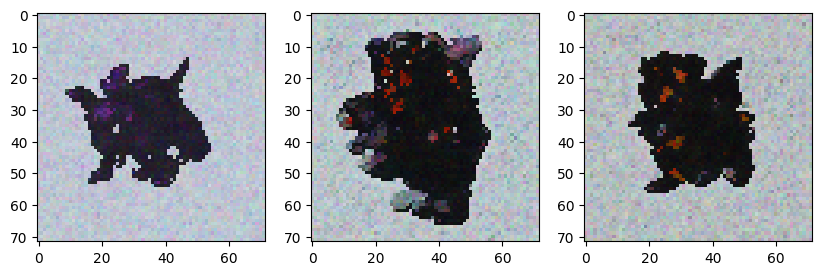

0.02113178:  83%|████████▎ | 207999/250001 [1:56:13<22:19, 31.36it/s]  

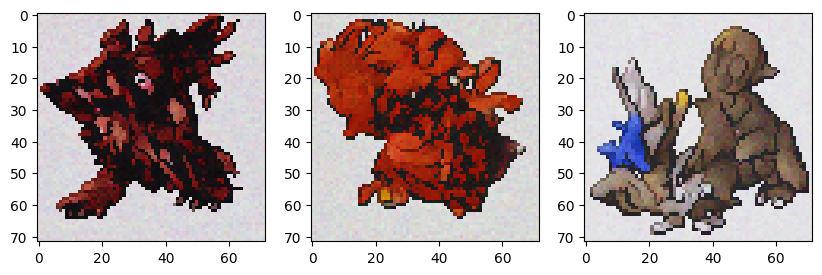

0.01709975:  84%|████████▍ | 209999/250001 [1:57:20<21:17, 31.31it/s]  

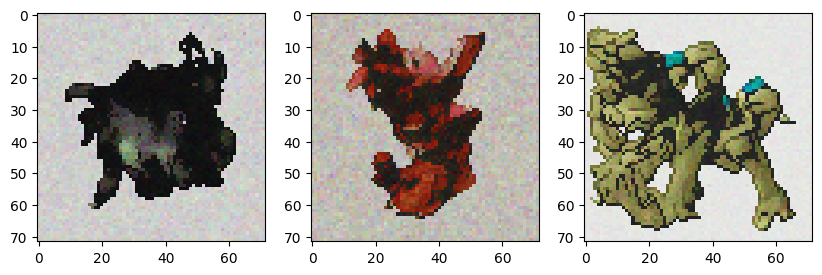

0.03126937:  85%|████████▍ | 211999/250001 [1:58:28<20:13, 31.33it/s]  

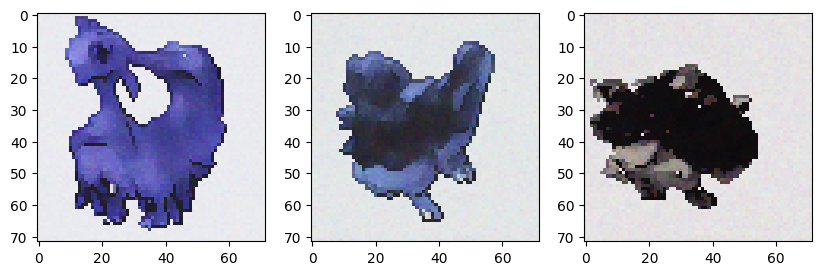

0.02027685:  86%|████████▌ | 213999/250001 [1:59:35<19:04, 31.46it/s]  

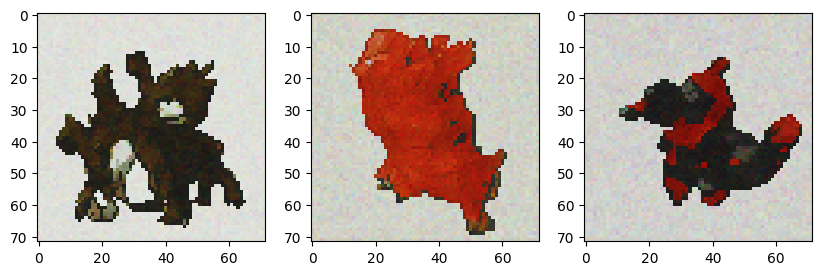

0.00751610:  86%|████████▋ | 215999/250001 [2:00:42<18:05, 31.34it/s]  

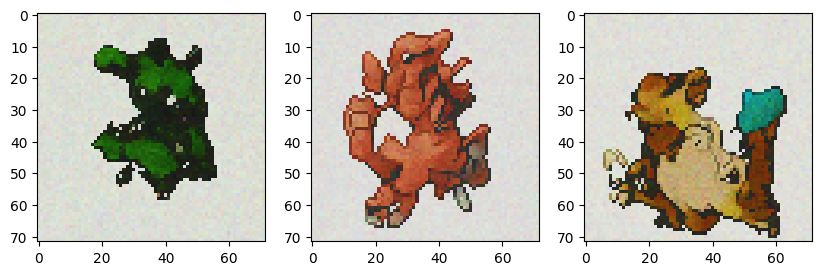

0.02441743:  87%|████████▋ | 217999/250001 [2:01:49<17:00, 31.36it/s]  

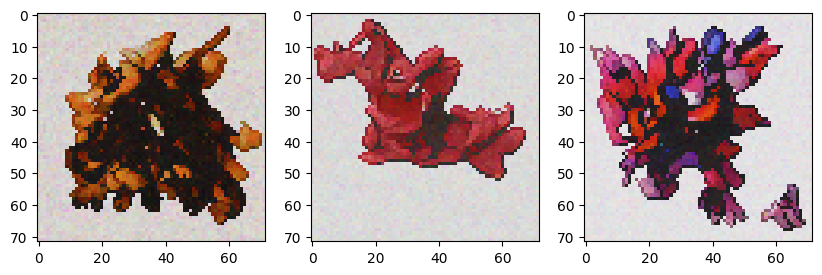

0.03033834:  88%|████████▊ | 219999/250001 [2:02:56<15:56, 31.36it/s]  

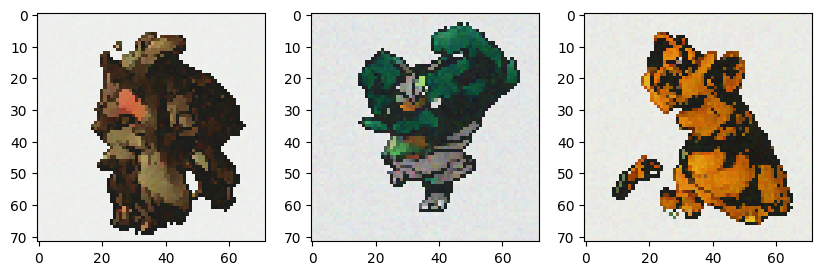

0.01500307:  89%|████████▉ | 221999/250001 [2:04:03<14:53, 31.33it/s]  

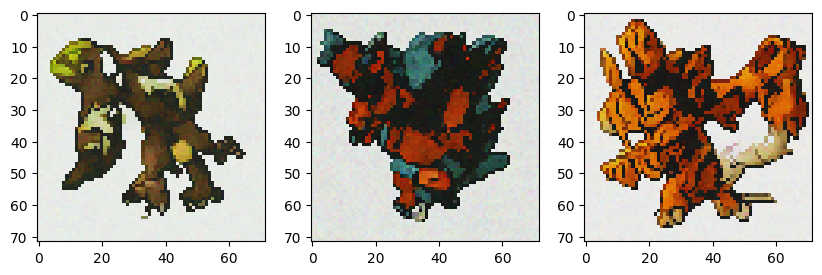

0.01503641:  90%|████████▉ | 223999/250001 [2:05:10<13:49, 31.35it/s]  

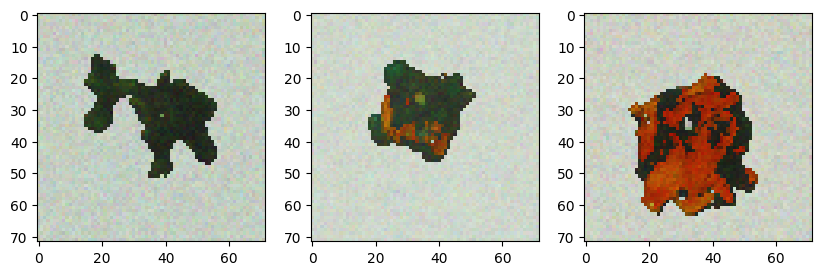

0.01712888:  90%|█████████ | 225999/250001 [2:06:17<12:47, 31.27it/s]  

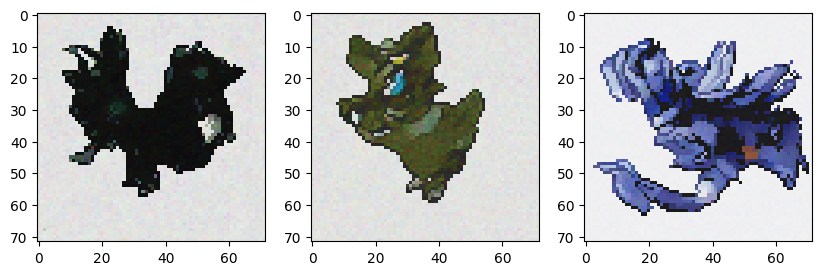

0.01947746:  91%|█████████ | 227999/250001 [2:07:24<11:40, 31.39it/s]  

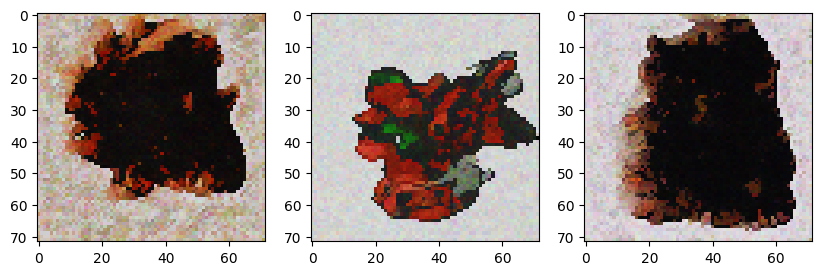

0.01498875:  92%|█████████▏| 229999/250001 [2:08:31<10:38, 31.31it/s]  

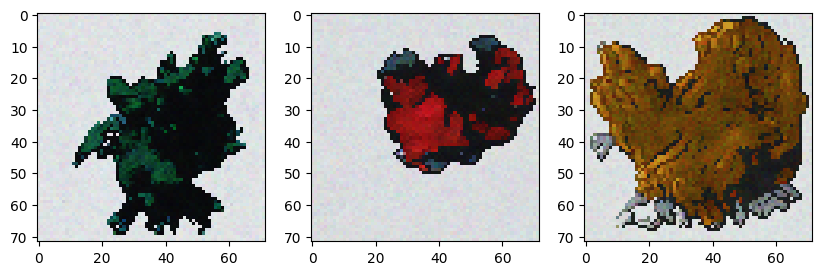

0.00934282:  93%|█████████▎| 231999/250001 [2:09:38<09:32, 31.46it/s]  

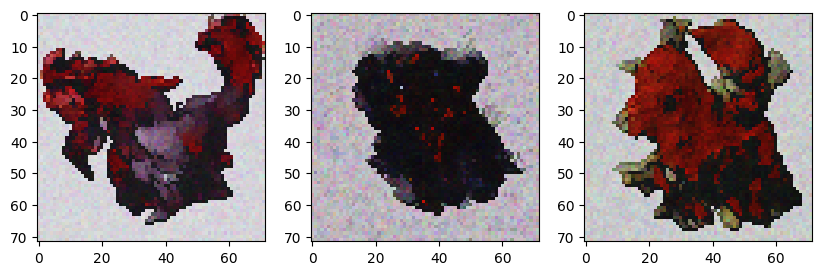

0.01317022:  94%|█████████▎| 233999/250001 [2:10:45<08:29, 31.40it/s]  

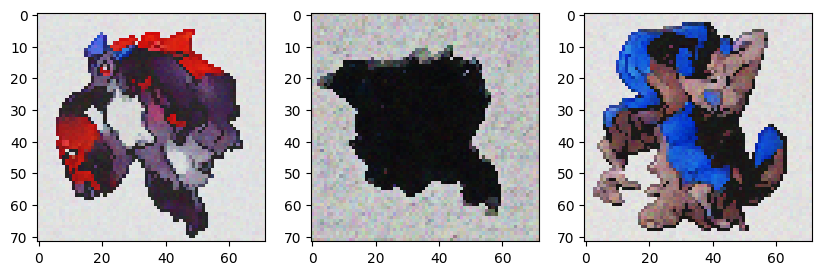

0.02245061:  94%|█████████▍| 235999/250001 [2:11:52<07:25, 31.40it/s]  

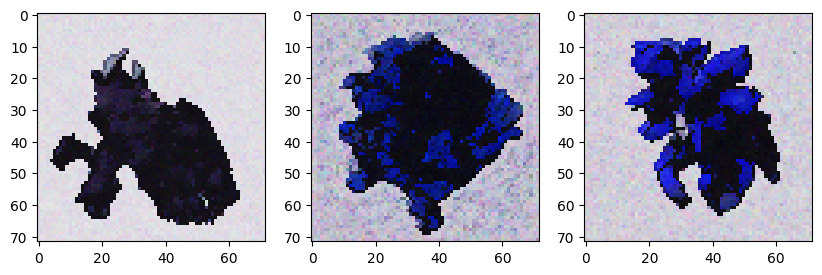

0.02193619:  95%|█████████▌| 237999/250001 [2:12:59<06:23, 31.31it/s]  

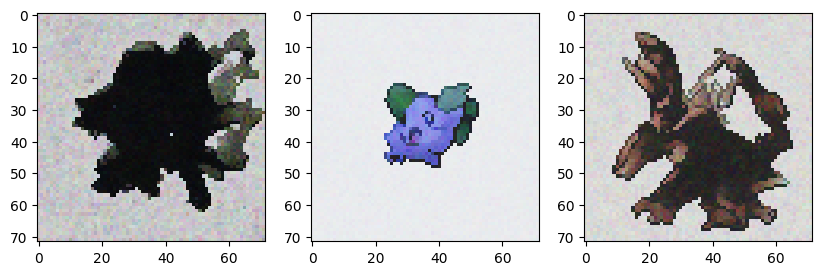

0.01992758:  96%|█████████▌| 239999/250001 [2:14:06<05:18, 31.37it/s]

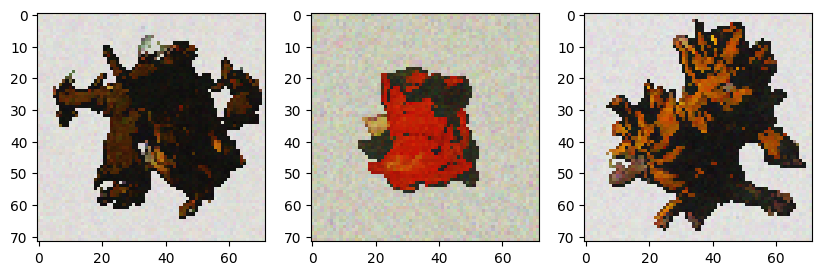

0.01013768:  97%|█████████▋| 241999/250001 [2:15:14<04:15, 31.34it/s]

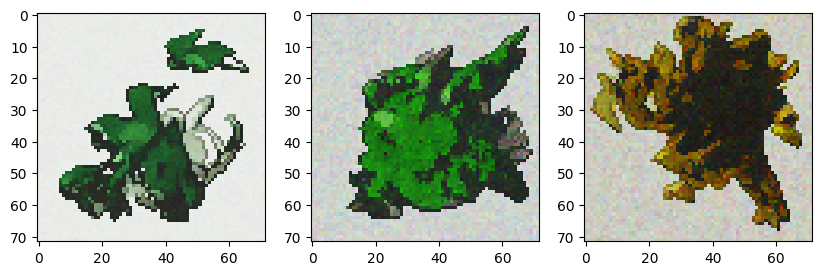

0.01895016:  98%|█████████▊| 243999/250001 [2:16:21<03:11, 31.35it/s]

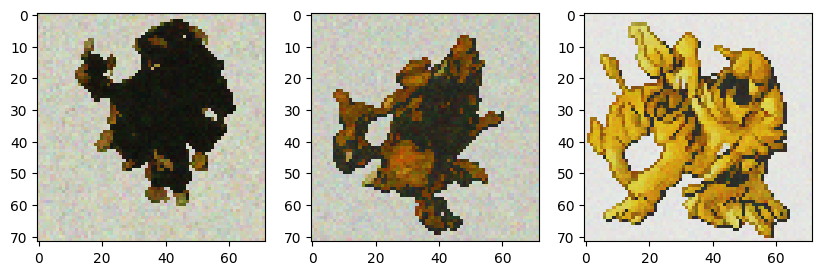

0.04475146:  98%|█████████▊| 245999/250001 [2:17:28<02:07, 31.32it/s]

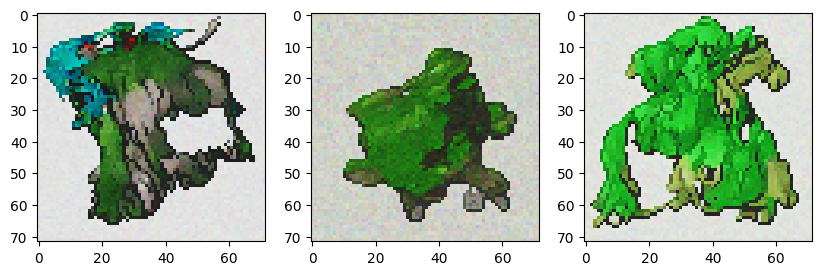

0.01652718:  99%|█████████▉| 247998/250001 [2:18:35<01:03, 31.32it/s]

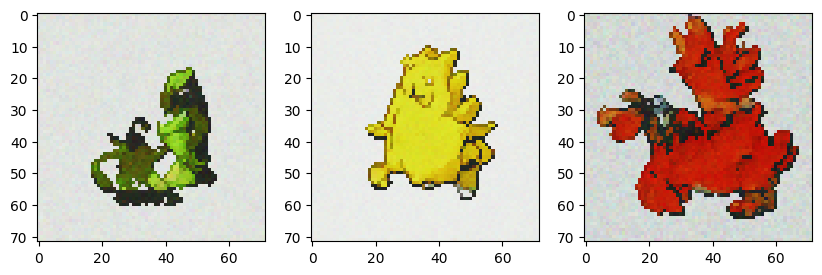

0.01147517: 100%|█████████▉| 249998/250001 [2:19:42<00:00, 31.32it/s]

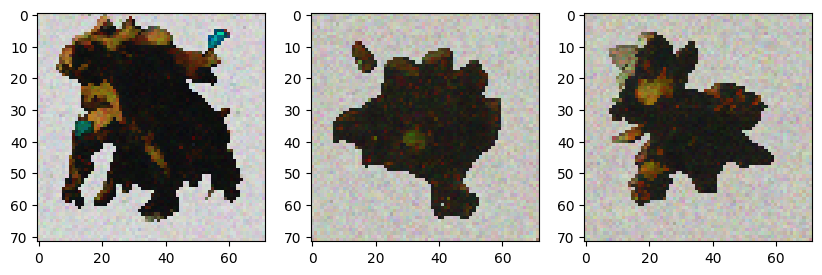

0.01523016: 100%|██████████| 250001/250001 [2:19:45<00:00, 29.81it/s]


In [8]:
loss_func = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

pbar = tqdm(range(250001))
def closure():
    optimizer.zero_grad()

    bs = 8

    source = randint(0, 2)
    batch = torch.randperm(385)[:bs]
    x0 = pimages[source, batch]
    x0 = torch.stack([transform(x) for x in x0], dim=0)
    x0 = isigmoid(x0)

    ty = types[batch]
    
    e = torch.randn_like(x0)
    t = torch.randint(0, T - 1, (bs,), device=device)

    xt = torch.sqrt(alpha_[t])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[t])[:, None, None, None] * e
    ep = model(xt, t, ty)

    loss = loss_func(ep, e)
    loss.backward()
    
    pbar.set_description(f"%.8f" % loss, refresh=False)
    
    return loss

model.train()
for j in pbar:
    optimizer.step(closure)

    if j % 2000 == 0:
        generate_image()

torch.save(model.state_dict(), 'model.pt')